In [1]:
import sys
sys.path.append('..')
from src.models.pipeline import pipeline
import glob
import json
import os
import pandas as pd
import ast
from datetime import datetime
from shutil import copyfile
from bayes_opt import BayesianOptimization
from bayes_opt.logger import JSONLogger
from bayes_opt.event import Events
from bayes_opt.util import load_logs
from src.models.train_model import functionsBuilder
from src.models.audio import downloadAudioFromYoutube
import warnings
warnings.filterwarnings("ignore")

In [2]:
groundbase_dir = '../data/raw/groundbase'
transcripts_dir = os.path.join(groundbase_dir,'transcripts')
topic_dataset_path = os.path.join(groundbase_dir,'dataset.csv')
results_csv = '../data/processed/bayesian_opt/phrases/lemmas_adv_propn.csv'

In [3]:
videos_ids = ['NuY7szYSXSw','XX7ePR21Ook','h9wxtqoa1jY','GJpt_3ie4WU','bTyxpoi2dmM']#['zWg7U0OEAoE','7kLHJ-F33GI','7snJ1mx1EMQ','RIawrYLVdIw','tORLeHHtazM']
transcript_filespath = [glob.glob(groundbase_dir + '/transcripts/{}.json'.format(vid))[0]
                                  for vid in videos_ids]
transcript_filespath

['../data/raw/groundbase/transcripts/NuY7szYSXSw.json',
 '../data/raw/groundbase/transcripts/XX7ePR21Ook.json',
 '../data/raw/groundbase/transcripts/h9wxtqoa1jY.json',
 '../data/raw/groundbase/transcripts/GJpt_3ie4WU.json',
 '../data/raw/groundbase/transcripts/bTyxpoi2dmM.json']

In [36]:

'''Read the transcript'''
transcripts_jsons = {}
for fl in transcript_filespath:
    with open(fl,encoding="utf8") as f:
        transcript =ast.literal_eval(f.read()) #json.load(f)
        vid = fl.split('/')[-1].split('.')[0]
        #print(vid)
        transcripts_jsons[vid] = transcript
#print(transcripts_jsons)

'''Read the videos metadata to perform on them the segmentation'''
df_videos = pd.read_csv(topic_dataset_path)

''' Transfer topic shifts time to seconds units instead HH:MM:SS'''

def topic_shifts_seconds(topic_shifts):
    tp_shift_sec=[]
    for tp in topic_shifts:
        intervals = tp.split(':')
        seconds = int(intervals[2])
        minutes = int(intervals[1]) * 60
        hours = int(intervals[0]) * 60 *60
        tp_shift_sec.append(seconds + minutes + hours)
    return tp_shift_sec


for video_id in transcripts_jsons.keys():    
    df_videos.at[df_videos['video id'] == video_id,'topic shifts(ends)'] =\
    topic_shifts_seconds(\
                         df_videos[df_videos['video id'] == \
                                   video_id]['topic shifts(ends)'])

In [37]:
transcripts_jsons.keys()

dict_keys(['NuY7szYSXSw', 'XX7ePR21Ook', 'h9wxtqoa1jY', 'GJpt_3ie4WU', 'bTyxpoi2dmM'])

Divide the dataset into 3 groups ( sd,audio,image) as correspoding to each model.
we want to  prepare to use the k-folds. Each group is a Test set of the type of the model group (sd,audio,image), the rest is the training dataset. 

each model is comprise of 3 different pipelines:
    None filter
    median 2,2
    median 3,3


In [38]:
models_workflow = {
    'sliding_window':[
        'sliding_window-tfidf-cosine-None-spectral_clustering',
        'sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering',
        "sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering"
    ]#,
    #'audio':[
    #    'audio-tfidf-cosine-None-spectral_clustering',
    #    'audio-tfidf-cosine-median_(2,2)-spectral_clustering',
    #    'audio-tfidf-cosine-median_(3,3)-spectral_clustering'
    #]#,
    #'image' : [
        
    #]
}
models = list(models_workflow.keys())
#videos_ids = df_videos.drop_duplicates(subset=['video id'])['video id'].values.tolist()
#print(videos_ids)



# *Configure now the parameters bounds as you wish*

In [54]:
'''Read the parameters bounds'''
with open(os.path.join('../models/bayesian_opt/experiment','parameters_bounds.json'),'r') as f:
    param_bounds = ast.literal_eval(f.read())
df_results =pd.read_csv(results_csv) #pd.DataFrame(columns=['video','max_target','workflow','params','param_bounds']) ##

In [55]:
df_results.head()
#param_bounds

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Unnamed: 0.1.1.1.1,Unnamed: 0.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1.1.1.1.1,Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1,video,max_target,workflow,params,param_bounds
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,zWg7U0OEAoE,0.384615,sliding_window-tfidf-cosine-None-spectral_clus...,"{'n_clusters': 14.502132028215444, 'sim_thresh...","{'window_size': (20, 150), 'step_size': (10, 6..."
1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,zWg7U0OEAoE,0.230769,sliding_window-tfidf-cosine-None-spectral_clus...,"{'n_clusters': 12.880535344902679, 'sim_thresh...","{'window_size': (20, 150), 'step_size': (10, 6..."
2,2,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,zWg7U0OEAoE,0.384615,sliding_window-tfidf-cosine-None-spectral_clus...,"{'n_clusters': 18.0, 'sim_thresh': 0.6, 'step_...","{'window_size': (20, 150), 'step_size': (10, 6..."
3,3,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,zWg7U0OEAoE,0.000000,sliding_window-tfidf-cosine-None-spectral_clus...,"{'n_clusters': 18.0, 'sim_thresh': 0.6, 'step_...","{'window_size': (20, 150), 'step_size': (10, 6..."
4,4,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,zWg7U0OEAoE,0.230769,sliding_window-tfidf-cosine-None-spectral_clus...,"{'n_clusters': 15.740314117671524, 'sim_thresh...","{'window_size': (20, 150), 'step_size': (10, 6..."


# Training the model

In [56]:
videos_ids


['NuY7szYSXSw', 'XX7ePR21Ook', 'h9wxtqoa1jY', 'GJpt_3ie4WU', 'bTyxpoi2dmM']

Train the models. Each video is running couple of times for bayesian opitmum.

running on video NuY7szYSXSw
Running workflow sliding_window-tfidf-cosine-None-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


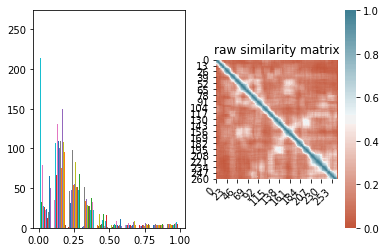

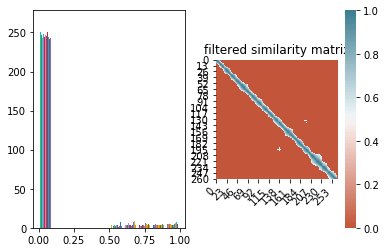

The results:
[158, 248, 369, 505, 680, 864, 1063, 1208, 1322, 1506, 1697, 1840, 2028, 2219, 2434, 2612, 2952, 3105, 3310, 3492, 3680, 4073, 4346, 4606, 4814]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  1        |  0.75     |  25.09    |  0.5161   |  10.0     |  135.1    |


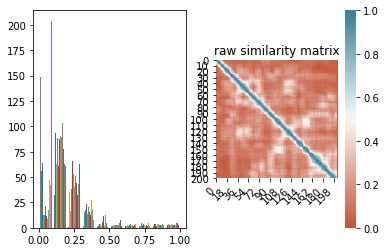

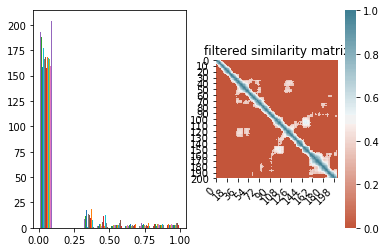

The results:
[128, 232, 332, 441, 631, 892, 1085, 1309, 1518, 1752, 1994, 2232, 2455, 2726, 2951, 3106, 3292, 3490, 3763, 4200, 4494, 4594, 4817]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  2        |  0.375    |  23.73    |  0.3277   |  13.73    |  137.3    |


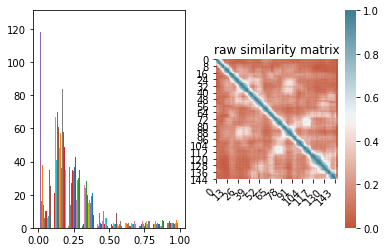

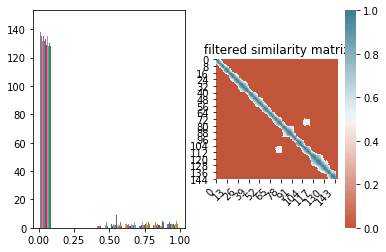

The results:
[150, 247, 349, 466, 639, 835, 1036, 1235, 1348, 1548, 1713, 1917, 2108, 2333, 2669, 2962, 3086, 3261, 3433, 3602, 3972, 4217, 4472, 4802]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  3        |  0.25     |  24.98    |  0.4616   |  18.38    |  154.3    |


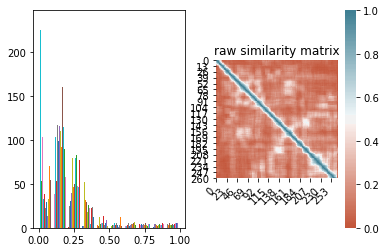

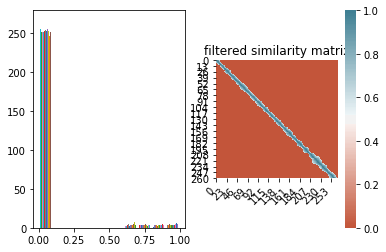

The results:
[89, 179, 244, 338, 479, 624, 791, 987, 1178, 1311, 1510, 1716, 1832, 1983, 2118, 2225, 2365, 2533, 2710, 2936, 3107, 3318, 3507, 3655, 4021, 4336, 4571, 4810]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  4        |  0.875    |  28.0     |  0.6      |  10.0     |  120.0    |


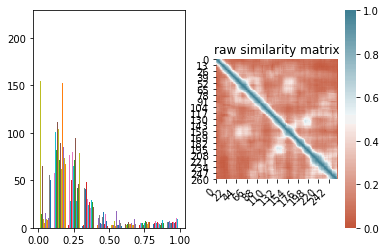

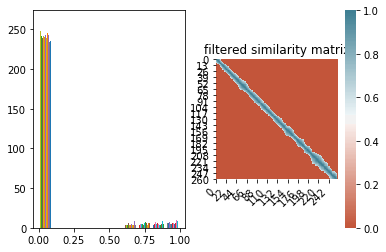

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.6      |  10.0     |  170.0    |


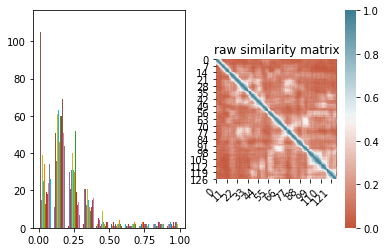

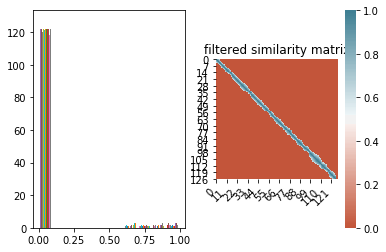

The results:
[120, 214, 318, 387, 509, 655, 811, 968, 1158, 1297, 1458, 1606, 1792, 1982, 2223, 2363, 2544, 2707, 2943, 3124, 3328, 3509, 3667, 3986, 4184, 4397, 4565, 4805]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  6        |  0.5      |  28.0     |  0.6      |  21.62    |  120.0    |


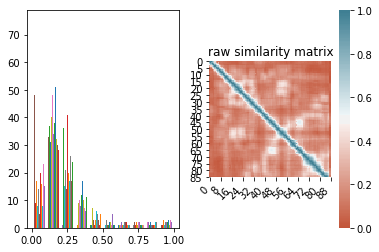

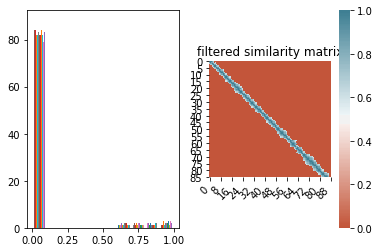

The results:
[132, 245, 330, 396, 485, 633, 798, 1028, 1244, 1499, 1767, 1988, 2160, 2315, 2430, 2521, 2696, 2981, 3078, 3279, 3366, 3552, 3665, 4094, 4342, 4512, 4793]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  7        |  0.5      |  28.0     |  0.6      |  30.0     |  148.3    |


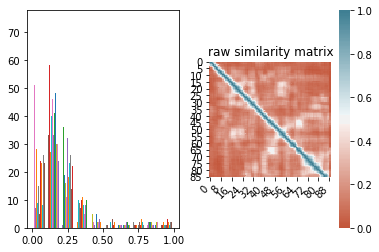

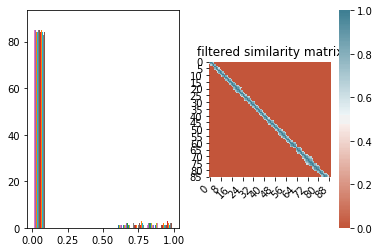

The results:
[175, 239, 357, 470, 610, 785, 953, 1169, 1270, 1438, 1593, 1754, 1923, 2078, 2203, 2354, 2505, 2684, 2858, 3016, 3219, 3313, 3527, 3783, 4029, 4256, 4498, 4811]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  8        |  0.25     |  28.0     |  0.6      |  30.0     |  131.0    |


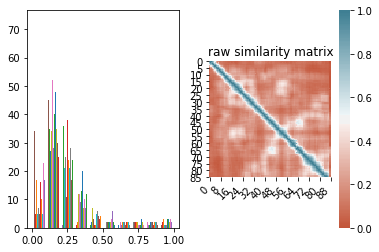

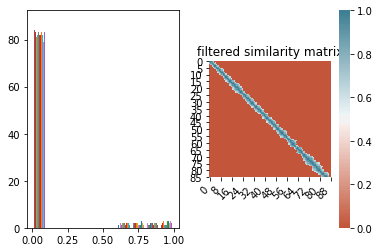

The results:
[189, 251, 405, 496, 585, 703, 868, 1194, 1292, 1562, 1774, 2001, 2123, 2270, 2438, 2537, 2664, 2886, 3037, 3240, 3331, 3509, 3748, 4103, 4297, 4466, 4811]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  9        |  0.875    |  28.0     |  0.6      |  30.0     |  161.9    |
NuY7szYSXSw
{'target': 0.875, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 120.0}}
Running workflow sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


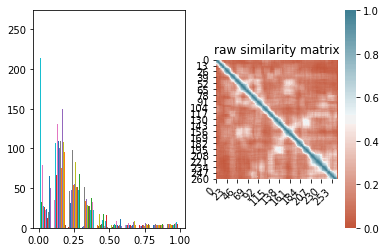

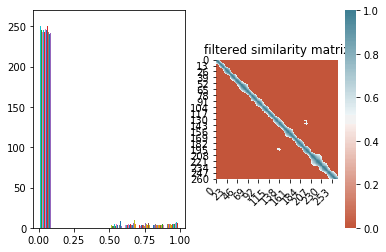

The results:
[170, 259, 369, 492, 641, 846, 1132, 1306, 1518, 1726, 1893, 2010, 2165, 2347, 2531, 2686, 2963, 3124, 3310, 3505, 3697, 4087, 4346, 4606]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  1        |  0.625    |  25.09    |  0.5161   |  10.0     |  135.1    |


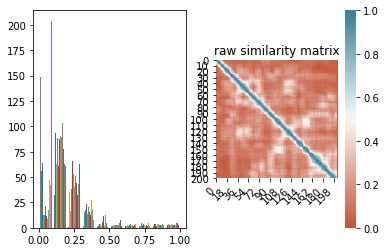

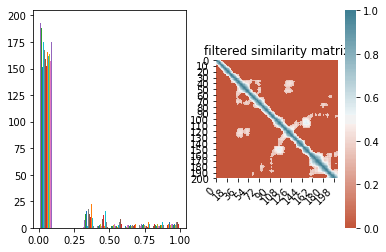

The results:
[154, 242, 348, 441, 559, 681, 892, 1085, 1286, 1461, 1735, 1953, 2151, 2426, 2705, 2967, 3129, 3310, 3505, 3797, 4361, 4594]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  2        |  0.375    |  23.73    |  0.3277   |  13.73    |  137.3    |


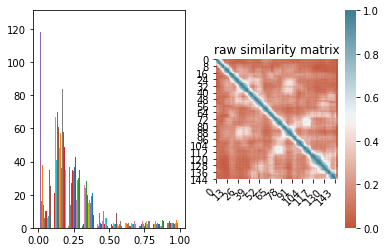

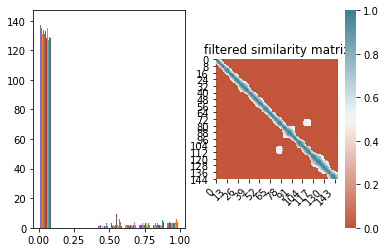

The results:
[150, 247, 368, 490, 639, 773, 1068, 1287, 1512, 1713, 1953, 2108, 2263, 2372, 2669, 2962, 3121, 3290, 3505, 3755, 4057, 4251, 4585]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  3        |  0.375    |  24.98    |  0.4616   |  18.38    |  154.3    |


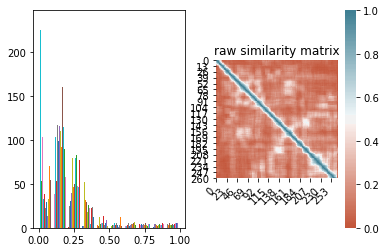

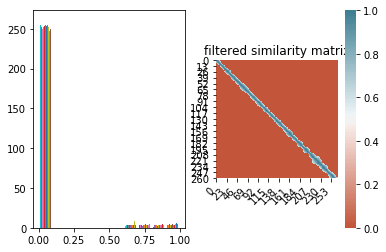

The results:
[137, 226, 324, 461, 567, 697, 853, 1052, 1194, 1311, 1510, 1716, 1832, 1994, 2180, 2308, 2446, 2557, 2710, 2954, 3122, 3332, 3519, 3717, 4091, 4369, 4587]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  4        |  0.5      |  28.0     |  0.6      |  10.0     |  120.0    |


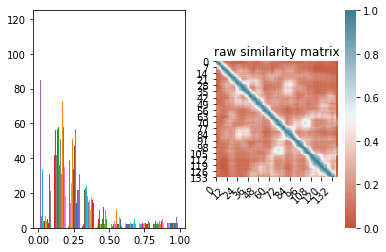

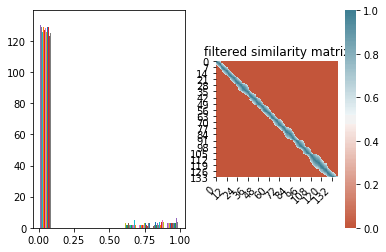

label 15 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.6      |  19.25    |  170.0    |


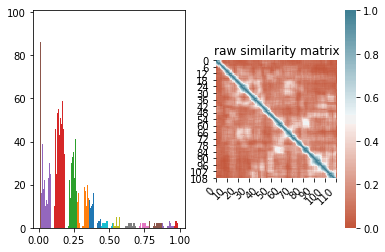

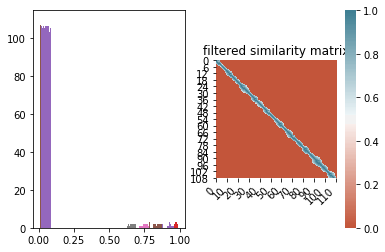

The results:
[133, 232, 323, 510, 683, 817, 998, 1209, 1327, 1498, 1762, 1939, 2060, 2211, 2330, 2450, 2584, 2679, 2947, 3065, 3199, 3344, 3516, 3705, 4058, 4388, 4677]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  6        |  0.375    |  28.0     |  0.6      |  24.84    |  120.0    |


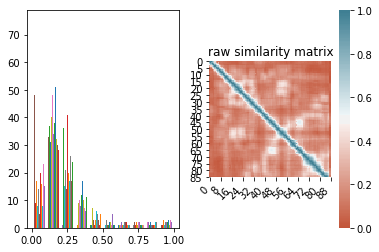

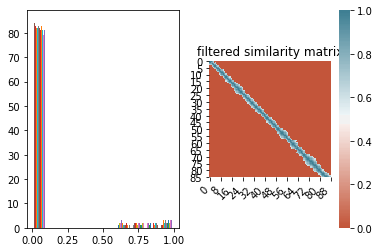

label 13 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  28.0     |  0.6      |  30.0     |  148.3    |


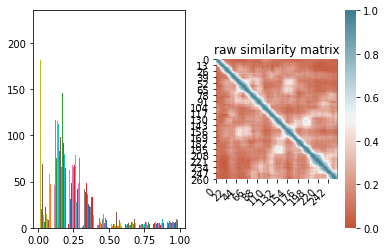

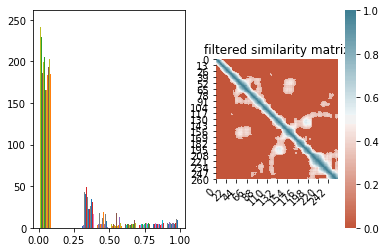

label 9 has done already cannot evaluate unsequentional segmentation, try other parameters
|  8        |  0.0      |  28.0     |  0.3      |  10.0     |  160.3    |


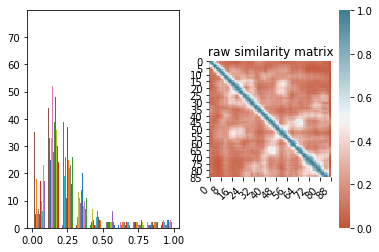

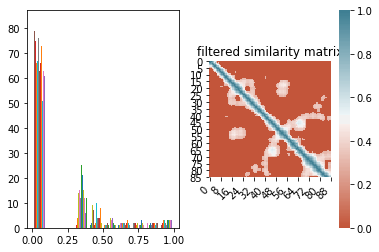

label 6 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  28.0     |  0.3      |  30.0     |  162.1    |
NuY7szYSXSw
{'target': 0.625, 'params': {'n_clusters': 25.08511002351287, 'sim_thresh': 0.5160973480326474, 'step_size': 10.002287496346899, 'window_size': 135.116628631592}}
Running workflow sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


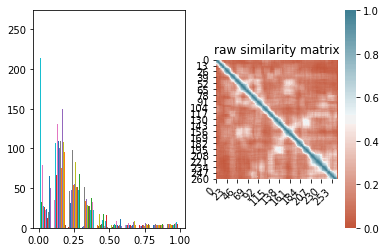

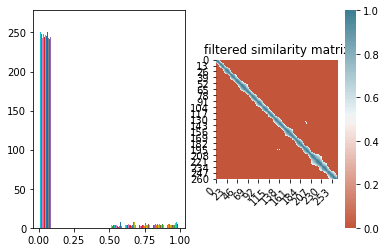

The results:
[158, 248, 357, 492, 659, 846, 1113, 1271, 1491, 1737, 1949, 2078, 2232, 2448, 2659, 2952, 3067, 3176, 3310, 3492, 3697, 4073, 4332, 4606, 4814]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  1        |  0.5      |  25.09    |  0.5161   |  10.0     |  135.1    |


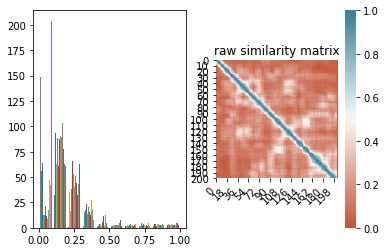

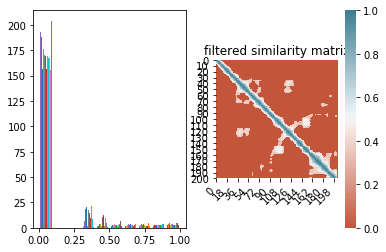

The results:
[154, 232, 299, 403, 520, 681, 922, 1061, 1286, 1479, 1735, 1931, 2151, 2426, 2705, 2967, 3106, 3292, 3530, 4040, 4342, 4513, 4817]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  2        |  0.25     |  23.73    |  0.3277   |  13.73    |  137.3    |


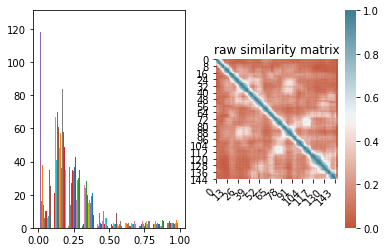

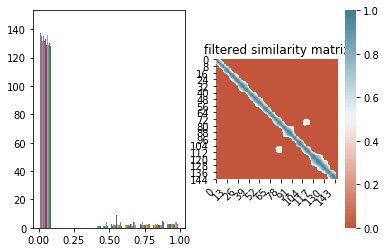

label 21 has done already cannot evaluate unsequentional segmentation, try other parameters
|  3        |  0.0      |  24.98    |  0.4616   |  18.38    |  154.3    |


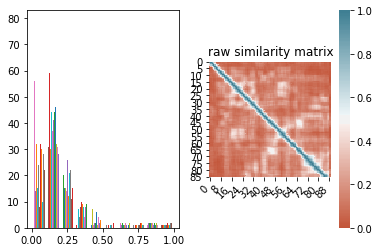

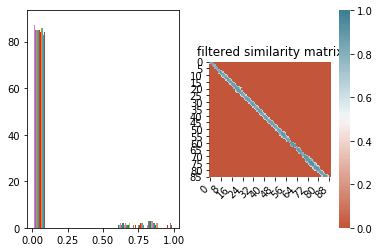

The results:
[155, 235, 311, 413, 547, 713, 889, 1057, 1212, 1360, 1524, 1700, 1800, 1960, 2135, 2347, 2492, 2673, 2956, 3105, 3257, 3349, 3518, 3770, 4070, 4303, 4491, 4798]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  4        |  0.375    |  28.0     |  0.6      |  30.0     |  120.0    |


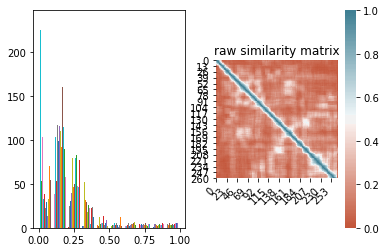

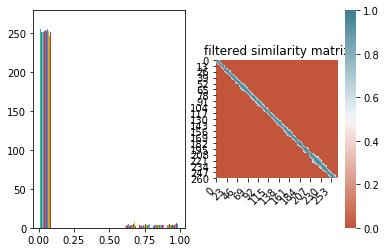

The results:
[137, 235, 338, 479, 668, 810, 987, 1178, 1328, 1510, 1716, 1843, 1994, 2180, 2348, 2510, 2710, 2936, 3093, 3288, 3362, 3507, 3655, 3979, 4188, 4369, 4587, 4810]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  5        |  0.5      |  28.0     |  0.6      |  10.0     |  120.0    |


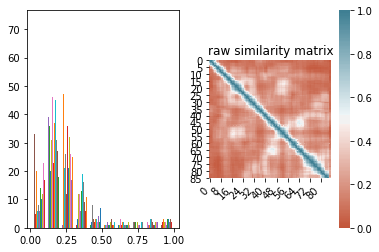

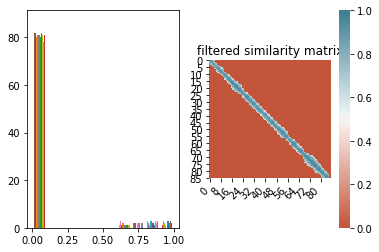

label 25 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  28.0     |  0.6      |  30.0     |  170.0    |


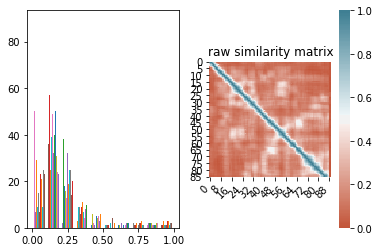

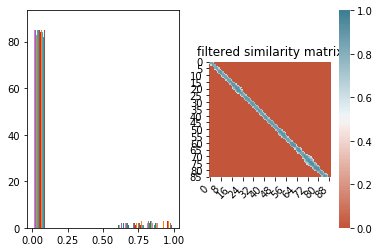

The results:
[177, 241, 359, 516, 679, 956, 1226, 1373, 1535, 1755, 1860, 2028, 2207, 2361, 2508, 2636, 2806, 2972, 3066, 3172, 3317, 3456, 3597, 3973, 4203, 4384, 4567, 4817]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  7        |  0.5      |  28.0     |  0.6      |  30.0     |  136.1    |


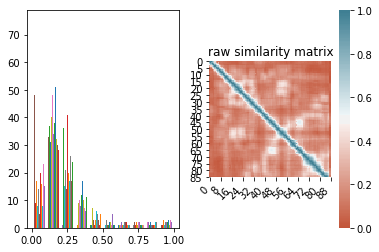

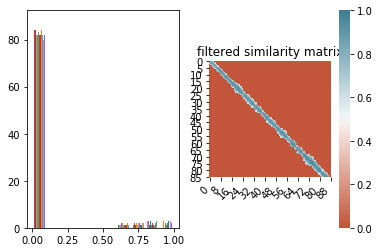

The results:
[132, 245, 364, 436, 526, 633, 798, 1126, 1281, 1546, 1767, 1988, 2104, 2160, 2258, 2430, 2589, 2759, 2981, 3132, 3323, 3415, 3552, 3799, 4094, 4459, 4793]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  8        |  0.625    |  28.0     |  0.6      |  30.0     |  149.0    |


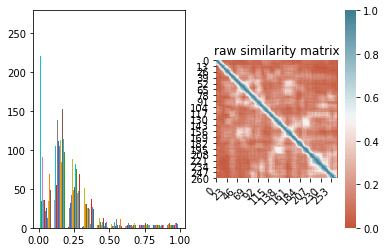

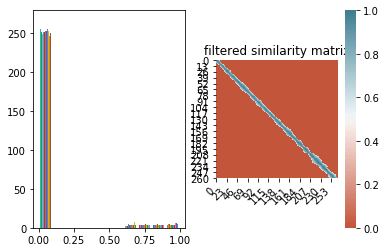

The results:
[165, 245, 340, 484, 652, 858, 1125, 1280, 1499, 1746, 1970, 2158, 2287, 2483, 2681, 2943, 3112, 3322, 3511, 3707, 4048, 4341, 4574, 4817]
The ground base:
[520, 590, 1835, 2028, 2090, 2570, 3470, 4320]
|  9        |  0.375    |  24.66    |  0.598    |  10.01    |  126.7    |
NuY7szYSXSw
{'target': 0.625, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 30.0, 'window_size': 148.99165247589048}}
running on video XX7ePR21Ook
Running workflow sliding_window-tfidf-cosine-None-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


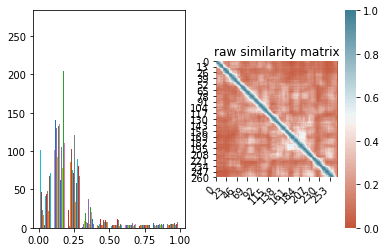

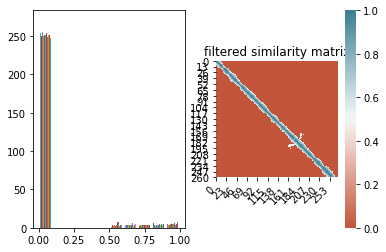

The results:
[145, 283, 436, 608, 777, 946, 1108, 1353, 1525, 1747, 1919, 2041, 2238, 2408, 2595, 2762, 3075, 3371, 3574, 3706, 3863, 4074, 4334, 4570, 4714]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  1        |  0.6      |  25.09    |  0.5161   |  10.0     |  135.1    |


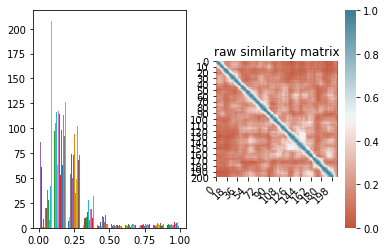

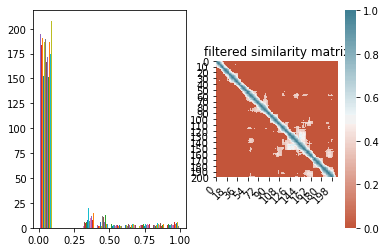

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


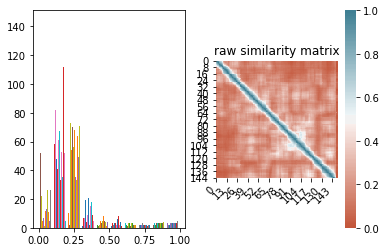

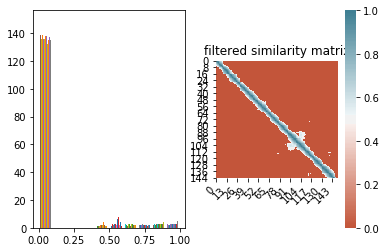

The results:
[93, 155, 289, 458, 611, 797, 1029, 1191, 1417, 1619, 1895, 2106, 2352, 2587, 2737, 3033, 3202, 3455, 3669, 3841, 4052, 4353, 4540, 4709]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  3        |  0.5      |  24.98    |  0.4616   |  18.38    |  154.3    |


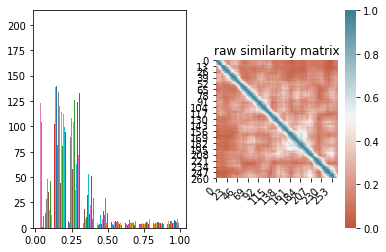

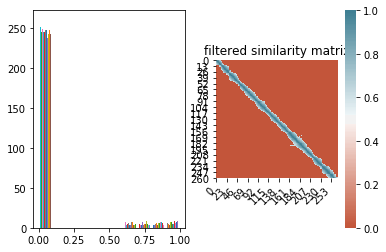

The results:
[171, 240, 374, 531, 730, 814, 983, 1142, 1397, 1571, 1734, 1878, 1997, 2222, 2326, 2489, 2684, 2815, 3126, 3432, 3608, 3732, 3970, 4122, 4359, 4489, 4568]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  4        |  0.6      |  28.0     |  0.6      |  10.0     |  170.0    |


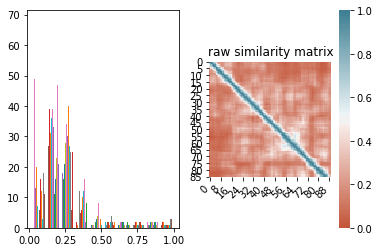

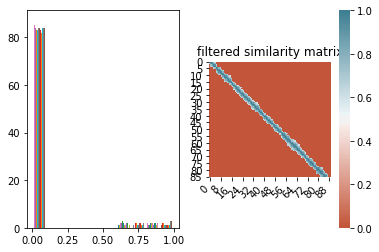

The results:
[98, 174, 248, 400, 487, 704, 751, 899, 1111, 1339, 1527, 1632, 1812, 1937, 2032, 2263, 2437, 2601, 2787, 3005, 3335, 3672, 3817, 3974, 4116, 4342, 4551]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  5        |  0.5      |  28.0     |  0.6      |  30.0     |  159.9    |


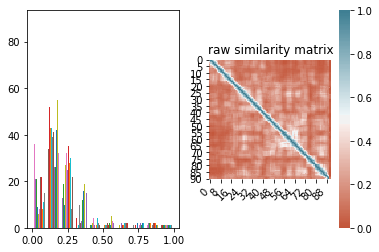

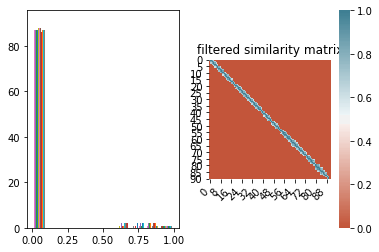

The results:
[112, 299, 413, 541, 719, 814, 1013, 1200, 1361, 1547, 1693, 1841, 1953, 2120, 2283, 2447, 2623, 2753, 2969, 3195, 3413, 3573, 3737, 3885, 4087, 4300, 4586, 4710]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  6        |  0.6      |  28.0     |  0.6      |  30.0     |  120.0    |


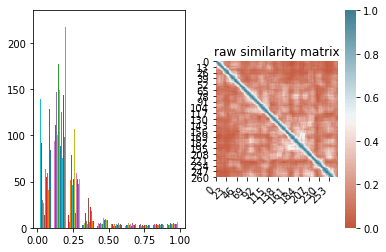

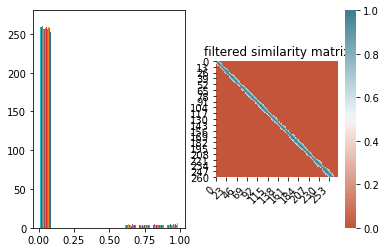

The results:
[137, 284, 429, 555, 704, 826, 1001, 1192, 1397, 1544, 1710, 1852, 2004, 2231, 2371, 2587, 2753, 2943, 3117, 3335, 3491, 3652, 3748, 3943, 4104, 4396, 4580]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  7        |  0.5      |  28.0     |  0.6      |  10.0     |  120.0    |


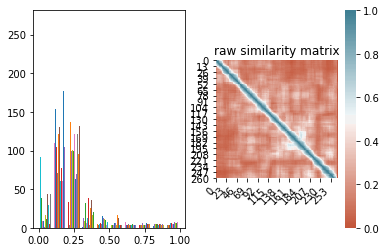

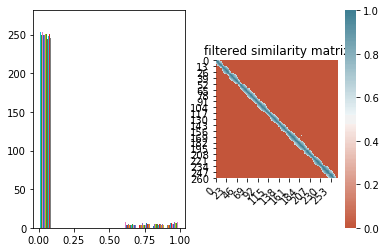

The results:
[109, 172, 259, 388, 520, 702, 804, 917, 1101, 1340, 1480, 1635, 1805, 1960, 2067, 2280, 2412, 2603, 2788, 3058, 3350, 3592, 3718, 3907, 4062, 4344, 4547, 4714]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  8        |  0.8      |  28.0     |  0.6      |  10.0     |  155.0    |


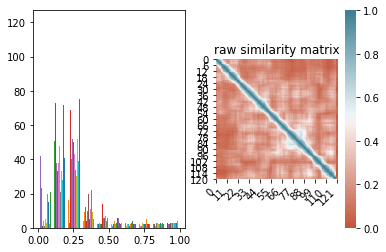

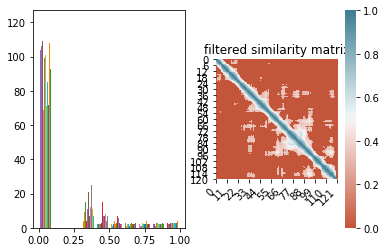

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  28.0     |  0.3      |  22.34    |  170.0    |
XX7ePR21Ook
{'target': 0.8, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 155.00978607188148}}
Running workflow sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


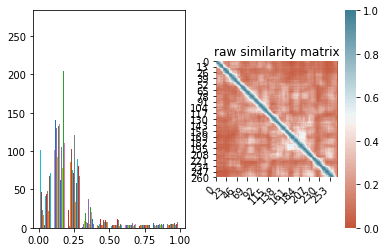

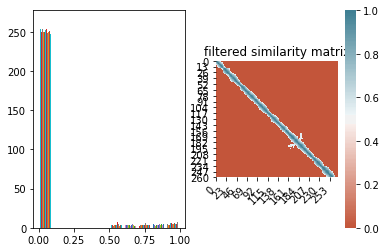

The results:
[97, 171, 283, 454, 629, 793, 963, 1226, 1495, 1769, 1953, 2106, 2318, 2472, 2692, 2850, 3112, 3387, 3595, 3739, 3921, 4097, 4355, 4570]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  1        |  0.7      |  25.09    |  0.5161   |  10.0     |  135.1    |


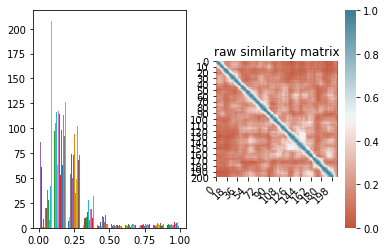

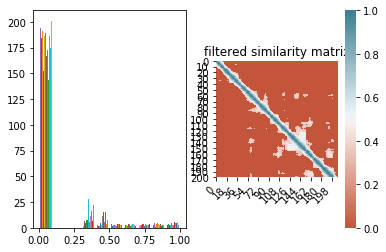

label 13 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


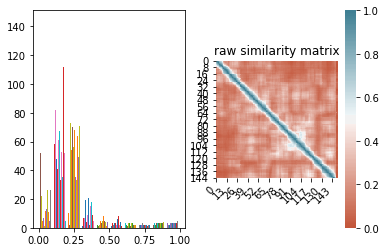

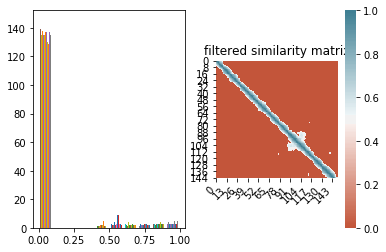

The results:
[155, 289, 458, 611, 797, 991, 1191, 1417, 1654, 1923, 2106, 2379, 2667, 2862, 3100, 3433, 3523, 3712, 3876, 4077, 4353, 4540, 4709]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  3        |  0.3      |  24.98    |  0.4616   |  18.38    |  154.3    |


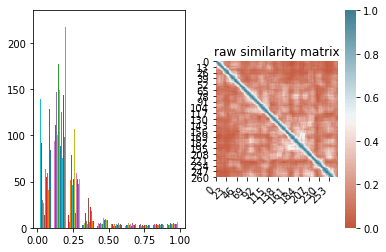

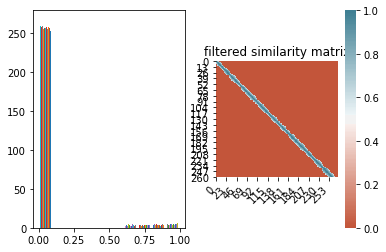

The results:
[88, 213, 299, 440, 597, 735, 843, 1001, 1192, 1397, 1527, 1694, 1866, 2018, 2261, 2437, 2625, 2782, 2974, 3195, 3429, 3634, 3768, 3904, 4104, 4334, 4595]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  4        |  0.4      |  28.0     |  0.6      |  10.0     |  120.0    |


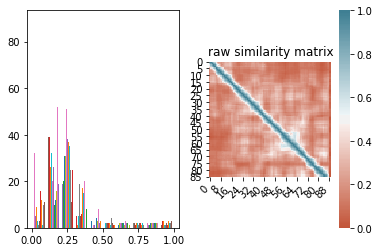

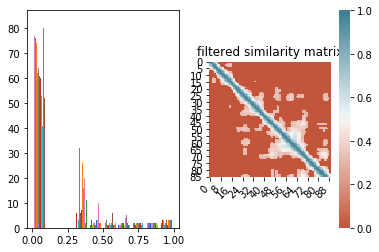

label 20 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.3      |  30.0     |  170.0    |


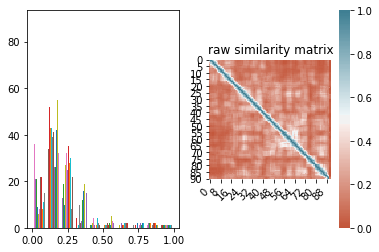

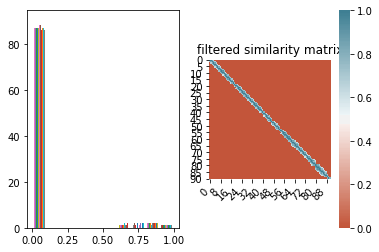

The results:
[149, 259, 375, 503, 675, 814, 968, 1139, 1361, 1455, 1595, 1744, 1841, 1953, 2120, 2283, 2515, 2698, 2867, 3031, 3195, 3464, 3631, 3843, 4087, 4351, 4628]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  6        |  0.6      |  28.0     |  0.6      |  30.0     |  120.0    |


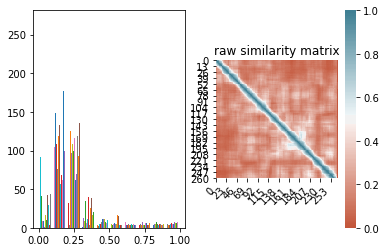

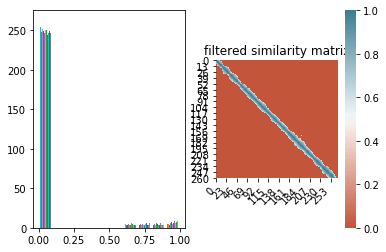

The results:
[125, 260, 390, 523, 676, 792, 933, 1104, 1321, 1481, 1671, 1824, 1962, 2121, 2317, 2456, 2650, 2837, 3112, 3375, 3572, 3720, 3915, 4064, 4212, 4451, 4582]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  7        |  0.8      |  28.0     |  0.6      |  10.0     |  158.5    |


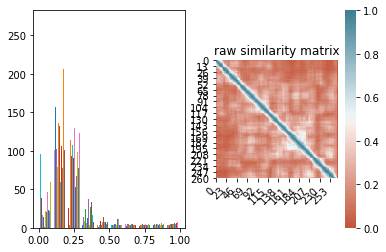

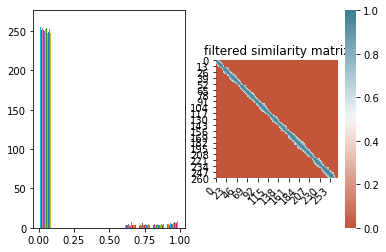

The results:
[118, 253, 381, 534, 710, 811, 979, 1166, 1347, 1502, 1678, 1867, 2024, 2256, 2384, 2574, 2738, 2859, 3121, 3395, 3586, 3700, 3808, 4000, 4146, 4368, 4576]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  8        |  0.6      |  28.0     |  0.6      |  10.0     |  147.9    |


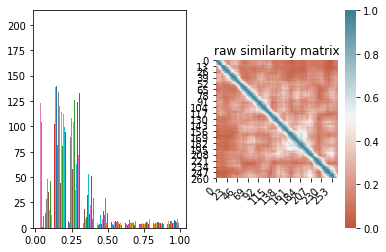

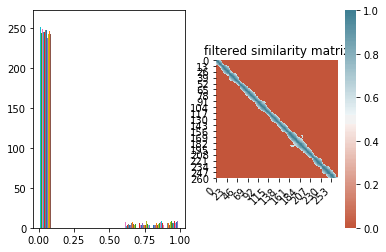

label 27 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  28.0     |  0.6      |  10.0     |  170.0    |
XX7ePR21Ook
{'target': 0.8, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 158.45374809339853}}
Running workflow sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


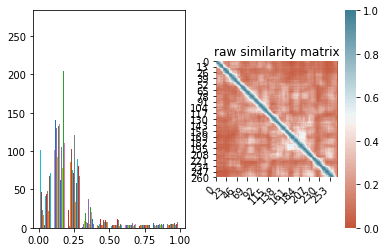

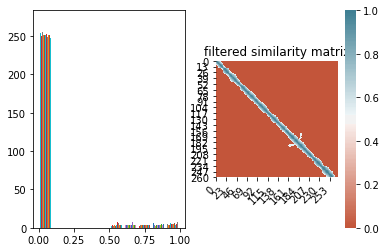

The results:
[145, 269, 436, 581, 700, 802, 963, 1172, 1393, 1556, 1769, 1933, 2057, 2296, 2530, 2762, 3089, 3387, 3595, 3739, 3883, 4074, 4334, 4570, 4714]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  1        |  0.8      |  25.09    |  0.5161   |  10.0     |  135.1    |


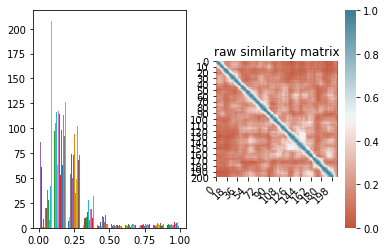

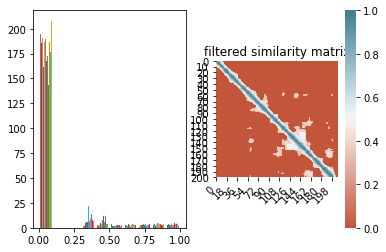

label 7 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


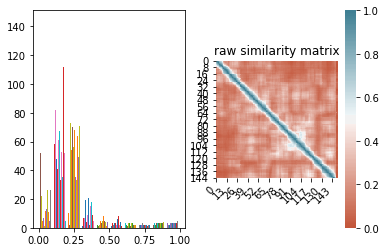

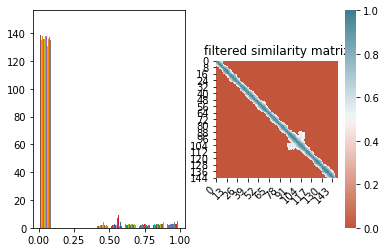

The results:
[181, 289, 458, 611, 797, 1029, 1221, 1417, 1587, 1782, 1986, 2218, 2417, 2737, 3066, 3263, 3489, 3712, 3876, 4052, 4180, 4384, 4567, 4709]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  3        |  0.3      |  24.98    |  0.4616   |  18.38    |  154.3    |


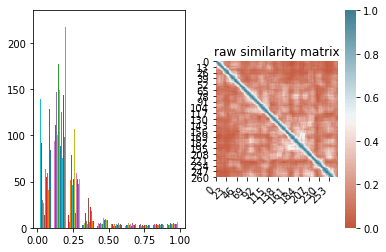

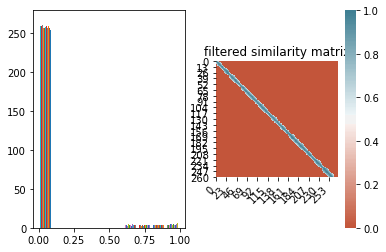

The results:
[104, 188, 284, 429, 555, 704, 811, 981, 1192, 1397, 1527, 1694, 1852, 2004, 2231, 2390, 2603, 2753, 2943, 3117, 3335, 3511, 3729, 3904, 4085, 4320, 4580]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  4        |  0.6      |  28.0     |  0.6      |  10.0     |  120.0    |


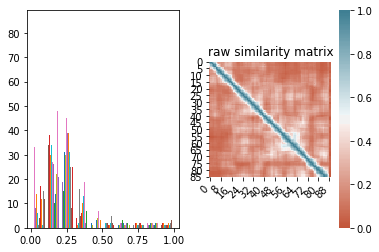

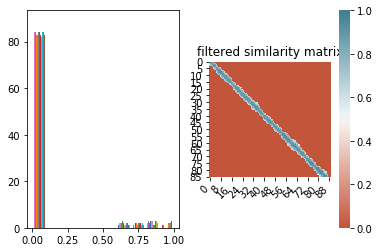

The results:
[136, 210, 249, 402, 572, 753, 901, 1012, 1234, 1439, 1636, 1813, 1995, 2215, 2327, 2554, 2837, 3062, 3338, 3556, 3709, 3867, 4022, 4117, 4287, 4511, 4695]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  5        |  0.3      |  28.0     |  0.6      |  30.0     |  161.8    |


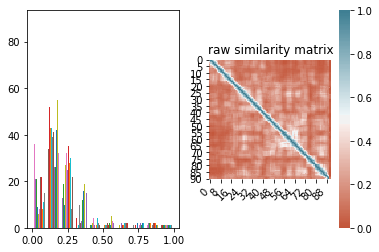

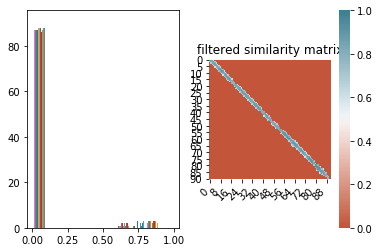

The results:
[149, 299, 453, 629, 764, 856, 1013, 1258, 1410, 1595, 1841, 1953, 2120, 2283, 2447, 2623, 2753, 2969, 3135, 3294, 3464, 3573, 3737, 3933, 4087, 4351, 4586, 4710]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  6        |  0.5      |  28.0     |  0.6      |  30.0     |  120.0    |


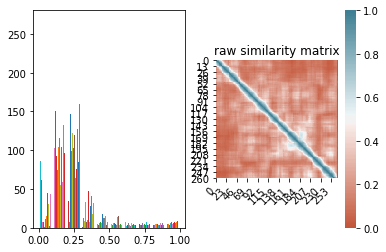

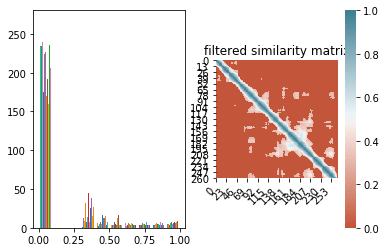

label 20 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  28.0     |  0.3      |  10.0     |  162.1    |


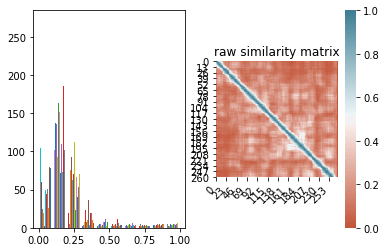

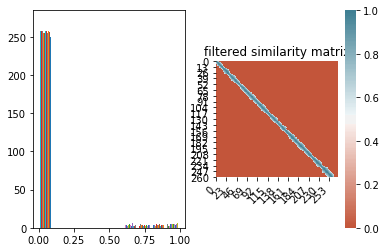

The results:
[150, 263, 382, 491, 686, 817, 995, 1184, 1387, 1519, 1690, 1823, 1927, 2010, 2220, 2401, 2607, 2770, 2966, 3143, 3381, 3590, 3753, 3915, 4067, 4326, 4566, 4717]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  8        |  0.6      |  28.0     |  0.6      |  10.0     |  128.6    |


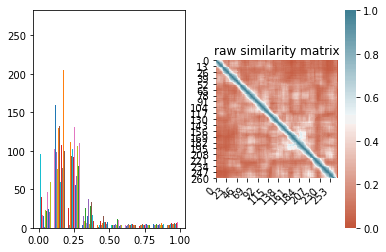

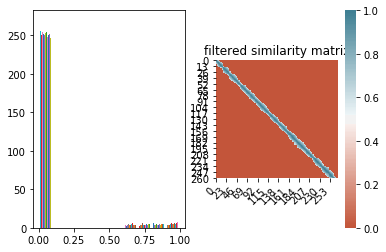

The results:
[153, 263, 381, 500, 695, 797, 924, 1080, 1311, 1444, 1587, 1774, 1951, 2087, 2331, 2497, 2677, 2814, 2982, 3217, 3418, 3606, 3712, 3851, 4070, 4330, 4542, 4715]
The ground base:
[300, 552, 665, 825, 945, 1072, 1535, 1920, 3570, 3810]
|  9        |  0.8      |  28.0     |  0.6      |  10.0     |  146.3    |
XX7ePR21Ook
{'target': 0.8, 'params': {'n_clusters': 25.08511002351287, 'sim_thresh': 0.5160973480326474, 'step_size': 10.002287496346899, 'window_size': 135.116628631592}}
running on video h9wxtqoa1jY
Running workflow sliding_window-tfidf-cosine-None-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


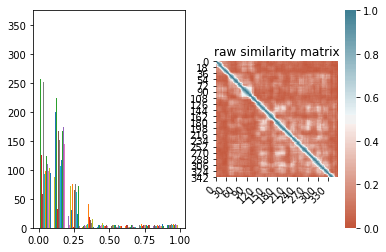

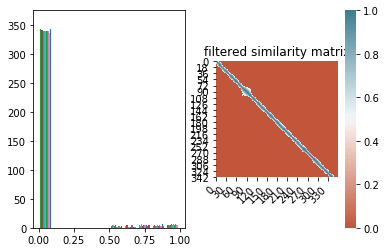

The results:
[119, 289, 486, 679, 950, 1152, 1510, 1694, 1895, 2128, 2270, 2409, 2569, 2771, 2920, 3014, 3156, 3368, 3677, 3924, 4181, 4404, 4614, 4796, 4964]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  1        |  0.6      |  25.09    |  0.5161   |  10.0     |  135.1    |


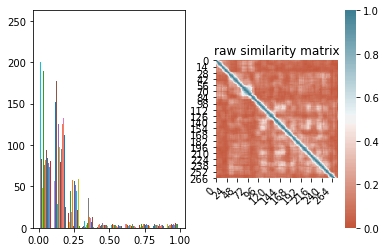

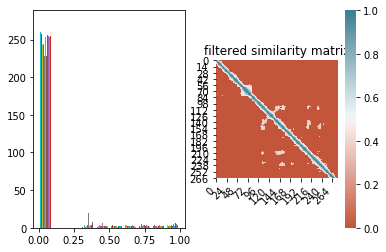

label 3 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


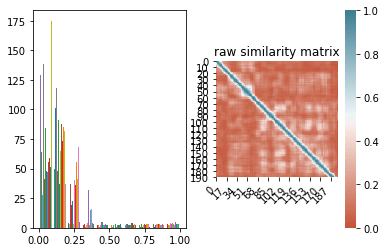

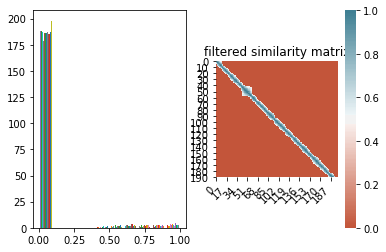

The results:
[134, 299, 490, 694, 949, 1137, 1531, 1690, 1919, 2131, 2277, 2404, 2563, 2797, 2979, 3157, 3362, 3701, 3907, 4159, 4402, 4628, 4795, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  3        |  0.7      |  24.98    |  0.4616   |  18.38    |  154.3    |


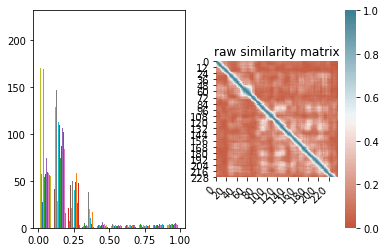

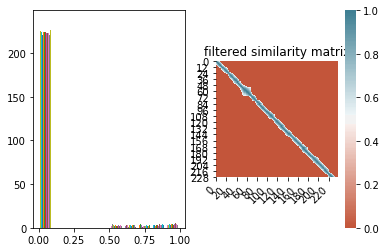

The results:
[110, 308, 491, 707, 944, 1148, 1517, 1687, 1886, 2112, 2272, 2415, 2568, 2781, 2934, 3056, 3246, 3488, 3725, 3918, 4148, 4394, 4626, 4788, 4957]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  4        |  0.6      |  25.74    |  0.5017   |  15.05    |  156.4    |


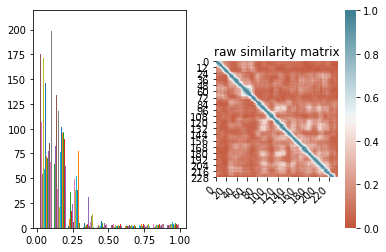

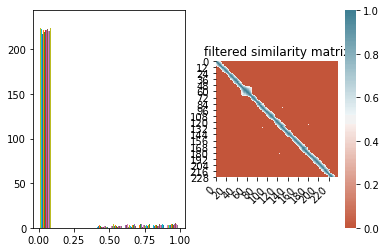

The results:
[93, 148, 272, 390, 537, 700, 941, 1169, 1535, 1701, 1902, 2128, 2270, 2413, 2583, 2780, 2925, 3008, 3162, 3375, 3696, 3875, 4051, 4233, 4413, 4646, 4811]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  5        |  0.7      |  28.0     |  0.4298   |  15.92    |  152.2    |


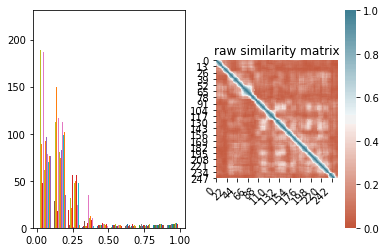

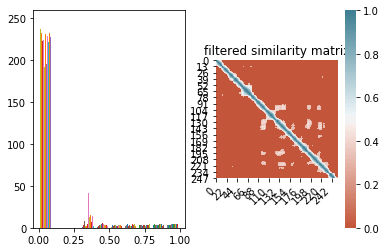

label 0 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  23.56    |  0.3      |  14.41    |  151.6    |


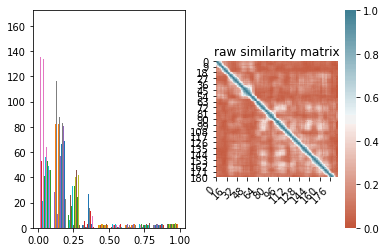

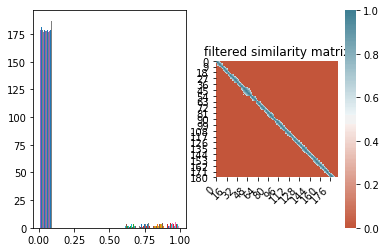

The results:
[120, 291, 418, 525, 720, 948, 1111, 1293, 1535, 1699, 1890, 2140, 2273, 2406, 2554, 2754, 2908, 3006, 3158, 3351, 3632, 3833, 4023, 4216, 4384, 4624, 4782, 4952]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  7        |  0.7      |  28.0     |  0.6      |  19.4     |  157.3    |


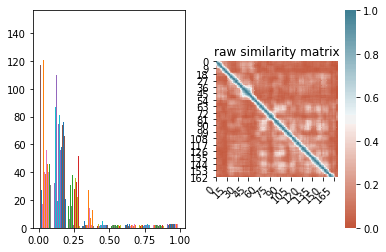

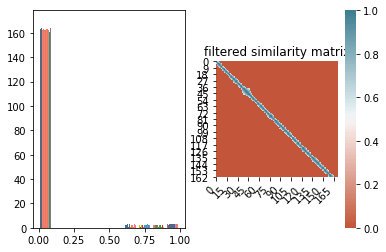

The results:
[123, 283, 364, 521, 693, 958, 1167, 1486, 1620, 1721, 1938, 2149, 2268, 2412, 2562, 2781, 2918, 3009, 3155, 3362, 3679, 3897, 4078, 4222, 4412, 4615, 4789, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  8        |  0.7      |  28.0     |  0.6      |  21.66    |  152.1    |


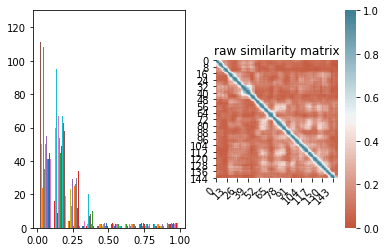

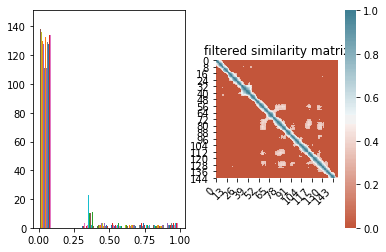

label 4 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  25.27    |  0.3      |  24.5     |  156.4    |
h9wxtqoa1jY
{'target': 0.7, 'params': {'n_clusters': 24.98383737115335, 'sim_thresh': 0.46164502020100706, 'step_size': 18.383890288065896, 'window_size': 154.26097501983799}}
Running workflow sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


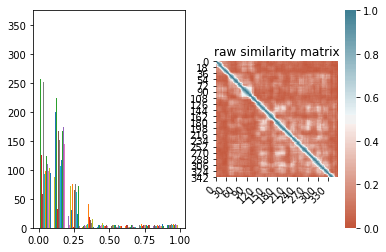

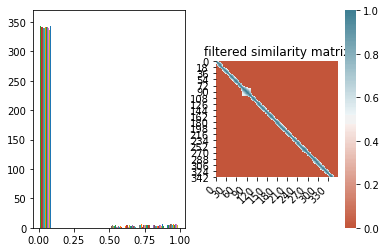

The results:
[119, 289, 497, 723, 950, 1166, 1524, 1705, 1907, 2145, 2277, 2409, 2582, 2783, 2914, 3008, 3148, 3356, 3677, 3924, 4162, 4416, 4624, 4807]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  1        |  0.6      |  25.09    |  0.5161   |  10.0     |  135.1    |


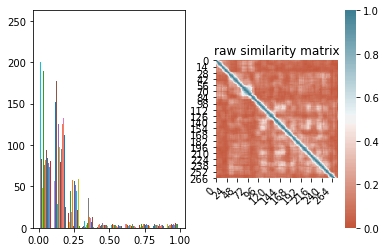

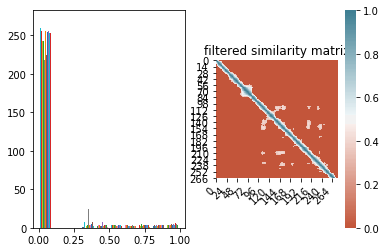

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


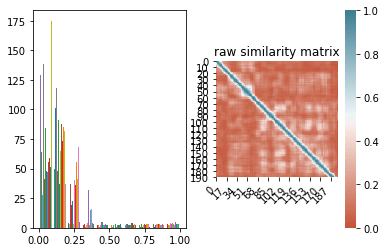

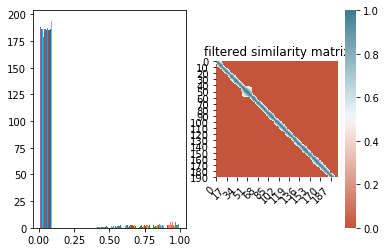

The results:
[148, 314, 490, 694, 949, 1163, 1554, 1712, 1919, 2131, 2277, 2404, 2563, 2797, 2995, 3139, 3383, 3701, 3933, 4159, 4431, 4651, 4811]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  3        |  0.6      |  24.98    |  0.4616   |  18.38    |  154.3    |


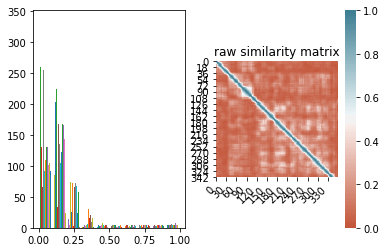

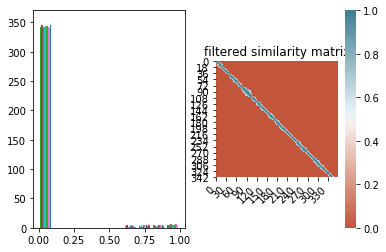

The results:
[117, 265, 376, 526, 721, 967, 1176, 1537, 1693, 1905, 2143, 2276, 2414, 2568, 2771, 2903, 3008, 3155, 3366, 3672, 3923, 4161, 4414, 4624, 4804]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  4        |  0.7      |  26.8     |  0.6      |  10.0     |  132.4    |


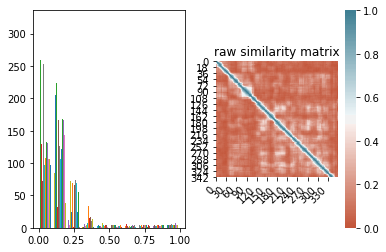

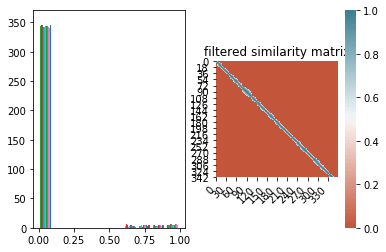

The results:
[116, 303, 492, 720, 967, 1173, 1537, 1701, 1949, 2234, 2407, 2579, 2810, 2997, 3146, 3354, 3672, 3923, 4180, 4413, 4623, 4804]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  5        |  0.8      |  23.71    |  0.6      |  10.0     |  131.9    |


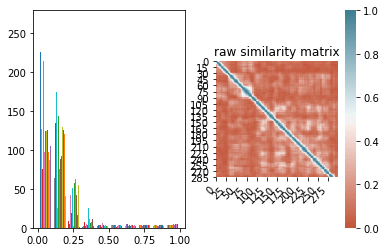

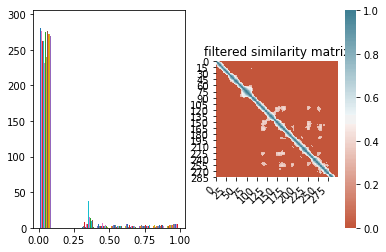

label 2 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  25.09    |  0.3      |  12.84    |  131.4    |


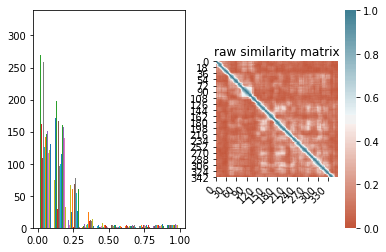

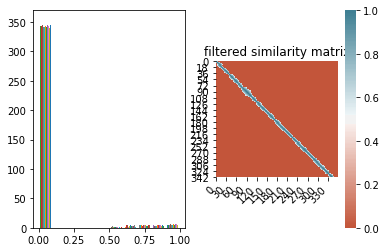

The results:
[124, 298, 509, 743, 965, 1172, 1536, 1701, 1959, 2232, 2405, 2576, 2819, 2994, 3144, 3352, 3665, 3933, 4159, 4412, 4621, 4802]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  7        |  0.8      |  23.64    |  0.5619   |  10.01    |  128.4    |


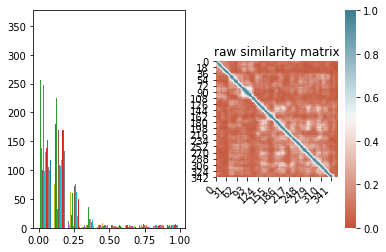

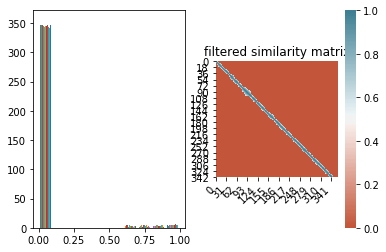

The results:
[114, 291, 501, 737, 963, 1169, 1546, 1707, 1957, 2241, 2404, 2574, 2818, 3003, 3152, 3340, 3662, 3930, 4170, 4409, 4620, 4799]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  8        |  0.7      |  23.0     |  0.6      |  10.0     |  125.0    |


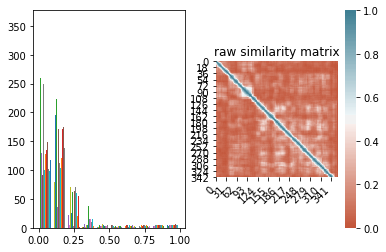

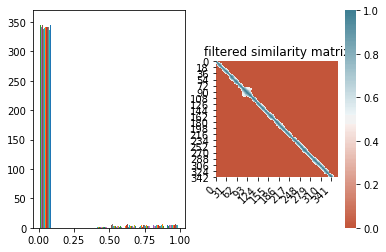

The results:
[115, 243, 363, 524, 742, 964, 1143, 1533, 1699, 1900, 2140, 2274, 2404, 2536, 2751, 2894, 3004, 3152, 3361, 3664, 3880, 4045, 4229, 4426, 4637, 4800]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  9        |  0.7      |  27.09    |  0.4555   |  10.16    |  126.5    |
h9wxtqoa1jY
{'target': 0.8, 'params': {'n_clusters': 23.707029645990197, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 131.94928073001992}}
Running workflow sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


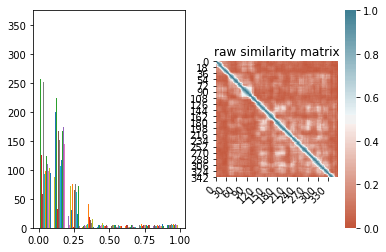

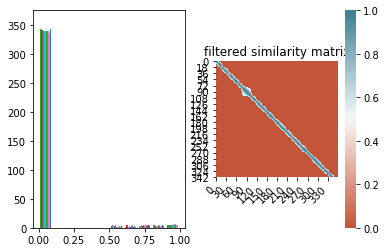

The results:
[119, 289, 486, 703, 950, 1152, 1524, 1694, 1907, 2128, 2270, 2409, 2556, 2793, 2988, 3138, 3336, 3656, 3884, 4041, 4210, 4404, 4614, 4796, 4964]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  1        |  0.6      |  25.09    |  0.5161   |  10.0     |  135.1    |


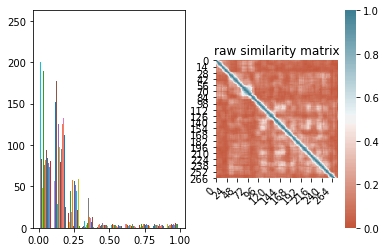

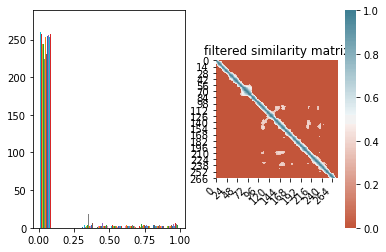

label 18 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


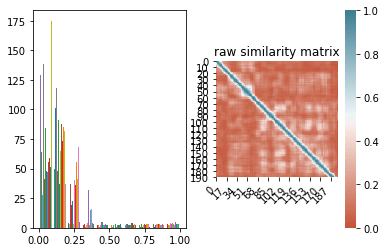

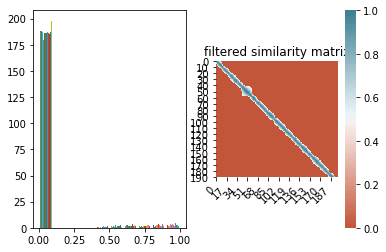

The results:
[134, 299, 469, 661, 919, 1137, 1531, 1712, 1947, 2178, 2340, 2433, 2610, 2822, 2995, 3157, 3362, 3672, 3907, 4159, 4402, 4628, 4795, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  3        |  0.5      |  24.98    |  0.4616   |  18.38    |  154.3    |


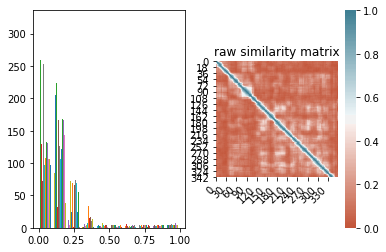

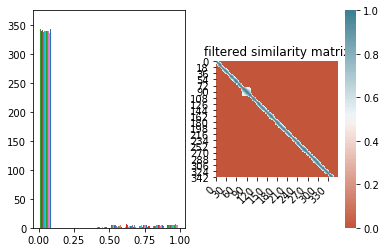

The results:
[108, 236, 355, 509, 700, 947, 1149, 1523, 1692, 1891, 2127, 2261, 2407, 2554, 2753, 2889, 2997, 3146, 3364, 3653, 3869, 4038, 4219, 4413, 4623, 4804, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  4        |  0.7      |  27.33    |  0.4829   |  10.03    |  131.4    |


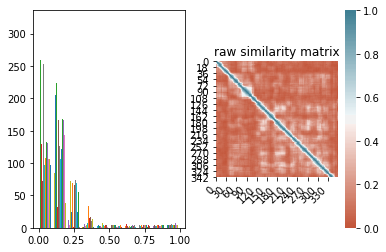

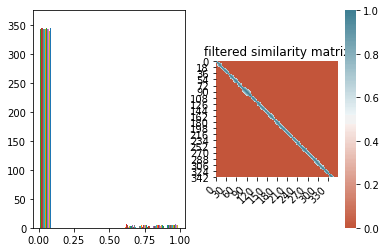

The results:
[116, 303, 492, 720, 967, 1163, 1523, 1701, 1949, 2234, 2407, 2568, 2791, 2985, 3146, 3354, 3653, 3923, 4161, 4397, 4612, 4795, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  5        |  0.7      |  23.31    |  0.6      |  10.0     |  131.0    |


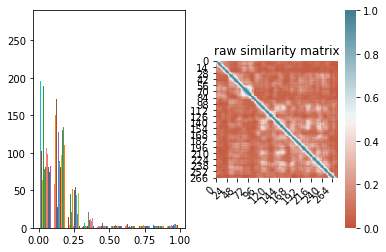

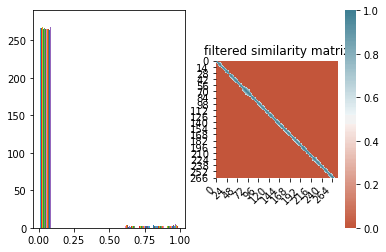

The results:
[107, 227, 351, 510, 732, 955, 1150, 1530, 1698, 1895, 2138, 2271, 2415, 2559, 2808, 2995, 3145, 3374, 3655, 3920, 4148, 4395, 4610, 4800, 4964]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  6        |  0.6      |  25.5     |  0.6      |  13.75    |  129.4    |


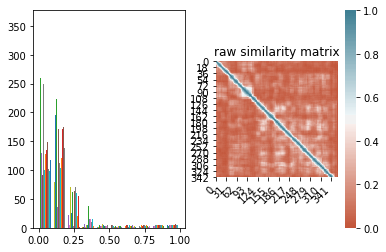

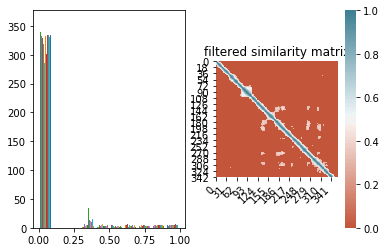

label 23 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  25.72    |  0.3      |  10.0     |  126.3    |


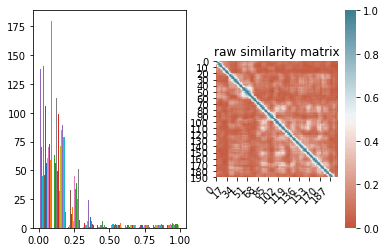

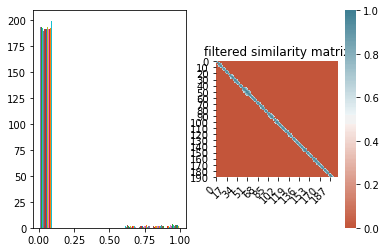

The results:
[108, 223, 351, 526, 710, 970, 1138, 1380, 1545, 1694, 1900, 2122, 2255, 2407, 2545, 2745, 2893, 3001, 3146, 3334, 3637, 3872, 4052, 4251, 4410, 4618, 4799, 4957]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  8        |  0.7      |  28.0     |  0.6      |  18.15    |  131.2    |


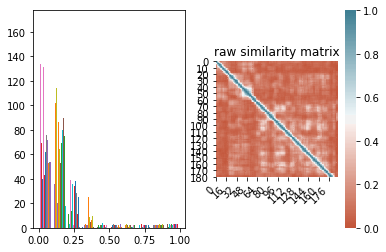

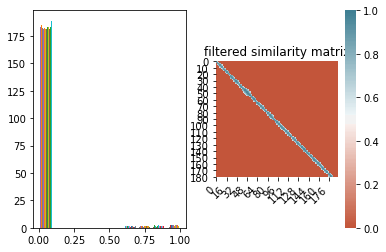

The results:
[126, 287, 496, 689, 968, 1173, 1551, 1701, 1926, 2202, 2391, 2557, 2790, 2991, 3145, 3344, 3632, 3926, 4196, 4422, 4610, 4802, 4960]
The ground base:
[509, 720, 767, 980, 1660, 1980, 2570, 2980, 4560, 4662]
|  9        |  0.6      |  23.56    |  0.6      |  19.32    |  128.9    |
h9wxtqoa1jY
{'target': 0.7, 'params': {'n_clusters': 27.32796217101075, 'sim_thresh': 0.48285855045071946, 'step_size': 10.0262385574942, 'window_size': 131.42763983838995}}
running on video GJpt_3ie4WU
Running workflow sliding_window-tfidf-cosine-None-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


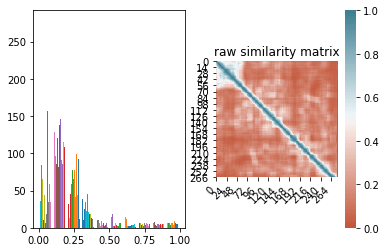

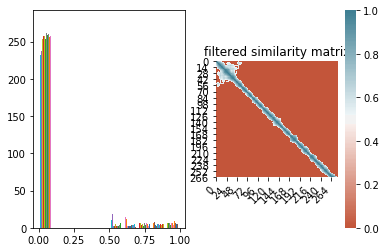

The results:
[112, 334, 738, 953, 1088, 1202, 1347, 1490, 1698, 1877, 2112, 2383, 2629, 2745, 2907, 3060, 3331, 3532, 3760, 3946, 4114, 4333, 4546, 4814, 4993]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  1        |  0.4286   |  25.09    |  0.5161   |  10.0     |  135.1    |


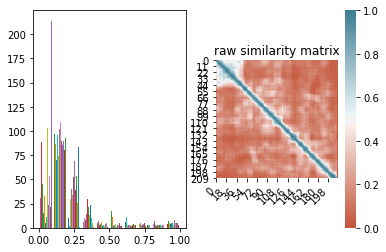

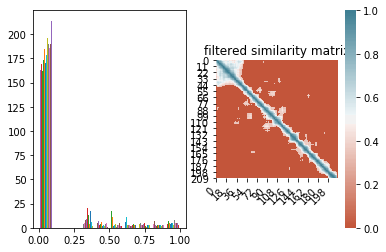

The results:
[263, 514, 750, 1024, 1198, 1424, 1613, 1885, 2152, 2415, 2615, 2860, 3034, 3326, 3521, 3688, 3918, 4022, 4201, 4332, 4470, 4728, 4994]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  2        |  0.2857   |  23.73    |  0.3277   |  13.73    |  137.3    |


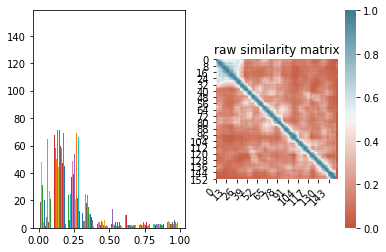

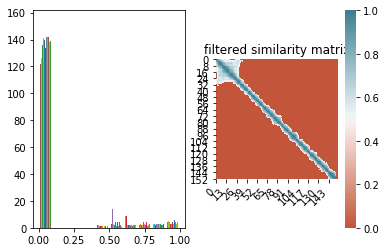

label 9 has done already cannot evaluate unsequentional segmentation, try other parameters
|  3        |  0.0      |  24.98    |  0.4616   |  18.38    |  154.3    |


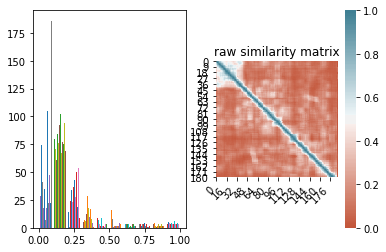

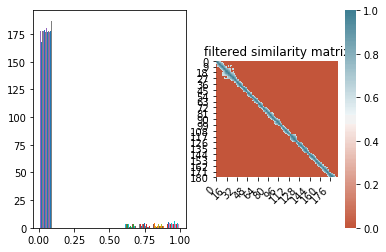

The results:
[117, 308, 486, 698, 875, 1046, 1188, 1344, 1455, 1657, 1838, 2072, 2377, 2610, 2751, 2882, 3042, 3293, 3358, 3537, 3692, 3802, 4014, 4193, 4377, 4564, 4754, 4999]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  4        |  0.7143   |  28.0     |  0.6      |  15.12    |  120.5    |


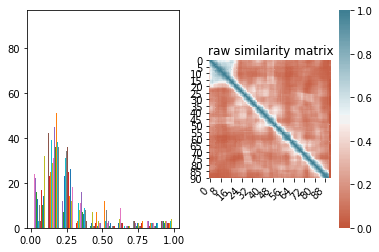

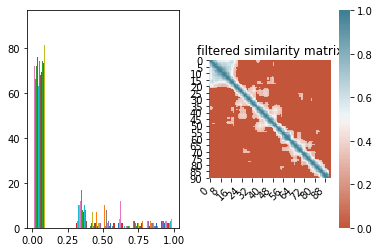

label 21 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.3      |  30.0     |  170.0    |


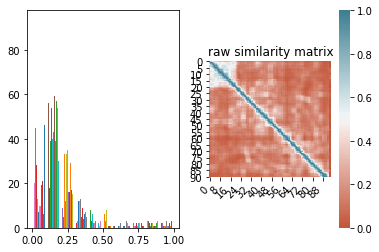

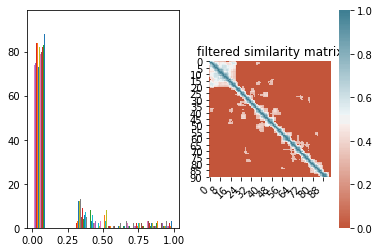

The results:
[160, 339, 599, 790, 1002, 1206, 1407, 1526, 1644, 1854, 2033, 2236, 2333, 2545, 2761, 2933, 3095, 3304, 3556, 3705, 3817, 4073, 4337, 4452, 4605, 4767, 4999]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  6        |  0.4286   |  28.0     |  0.3      |  30.0     |  120.0    |


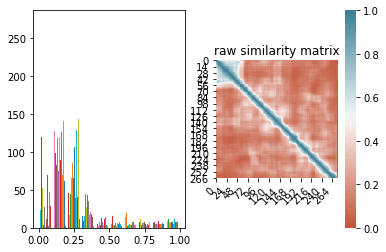

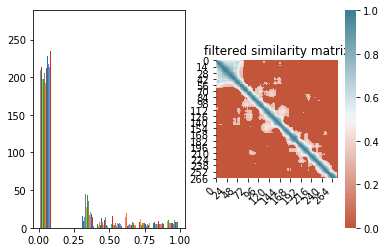

label 20 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  28.0     |  0.3      |  10.0     |  170.0    |


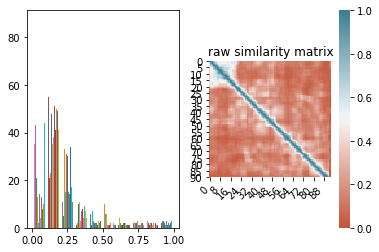

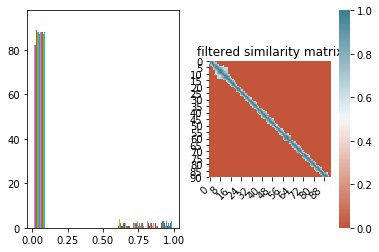

The results:
[137, 309, 614, 804, 1014, 1169, 1271, 1371, 1534, 1713, 1876, 2185, 2406, 2612, 2733, 2883, 3066, 3317, 3518, 3659, 3780, 3997, 4083, 4302, 4510, 4665, 4980]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  8        |  0.4286   |  28.0     |  0.6      |  30.0     |  136.1    |


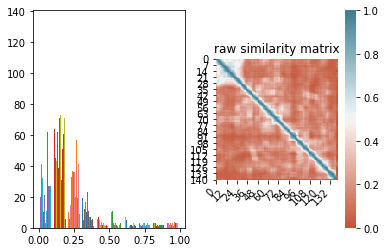

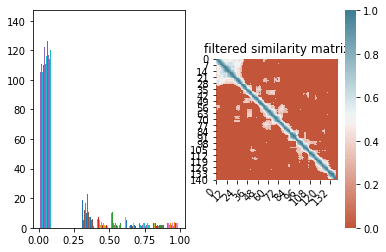

The results:
[157, 396, 685, 935, 1115, 1210, 1273, 1410, 1634, 1848, 2016, 2188, 2436, 2612, 2785, 3067, 3301, 3492, 3707, 3842, 4000, 4156, 4304, 4448, 4624, 4767, 4997]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  9        |  0.2857   |  28.0     |  0.3      |  20.6     |  128.8    |
GJpt_3ie4WU
{'target': 0.7142857142857143, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 15.118069869611945, 'window_size': 120.49905827598639}}
Running workflow sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


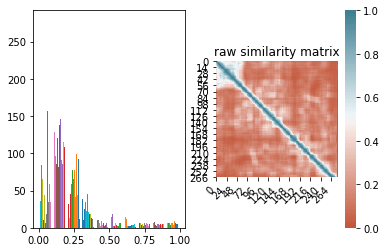

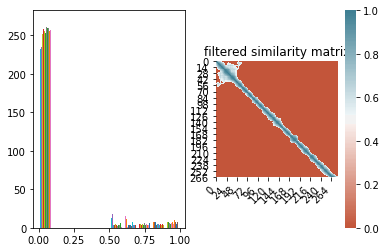

label 2 has done already cannot evaluate unsequentional segmentation, try other parameters
|  1        |  0.0      |  25.09    |  0.5161   |  10.0     |  135.1    |


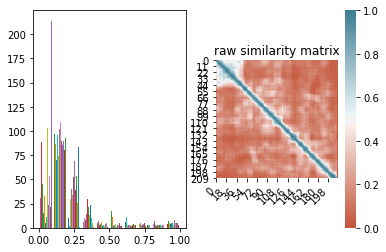

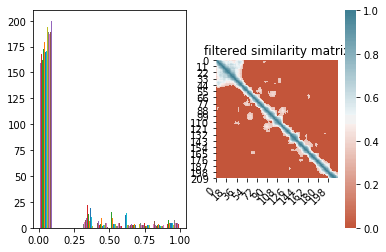

The results:
[225, 495, 708, 1024, 1198, 1424, 1538, 1756, 1941, 2175, 2393, 2530, 2641, 2860, 3059, 3326, 3537, 3770, 4022, 4312, 4561, 4797]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  2        |  0.4286   |  23.73    |  0.3277   |  13.73    |  137.3    |


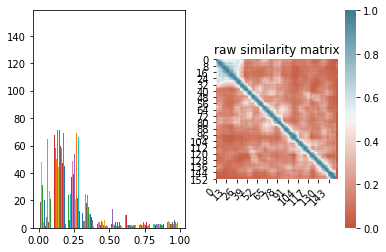

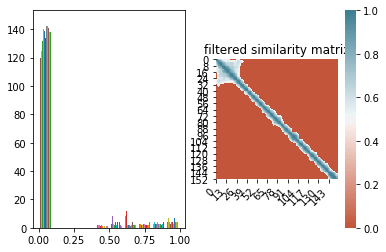

label 8 has done already cannot evaluate unsequentional segmentation, try other parameters
|  3        |  0.0      |  24.98    |  0.4616   |  18.38    |  154.3    |


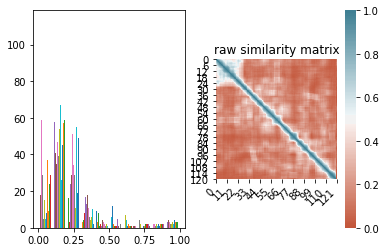

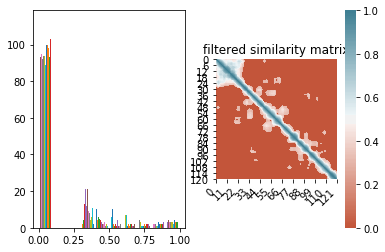

label 3 has done already cannot evaluate unsequentional segmentation, try other parameters
|  4        |  0.0      |  27.66    |  0.3      |  23.81    |  137.7    |


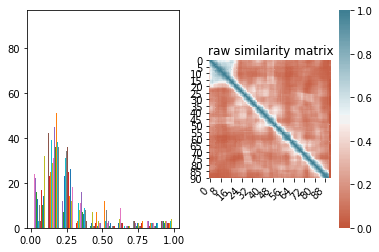

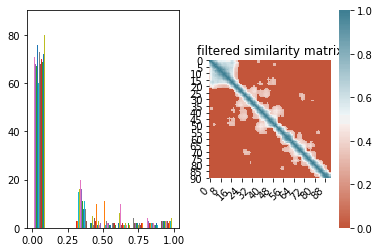

label 20 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.3      |  30.0     |  170.0    |


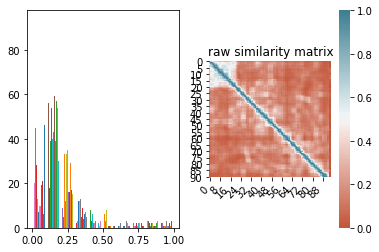

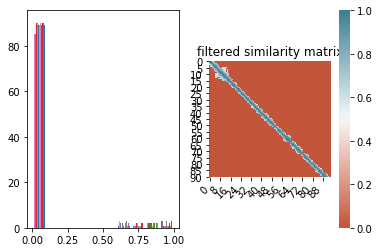

The results:
[128, 298, 475, 738, 892, 1055, 1161, 1306, 1464, 1644, 1854, 2092, 2276, 2434, 2713, 2811, 3002, 3095, 3350, 3556, 3757, 3817, 4024, 4180, 4337, 4605, 4821]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  6        |  1.0      |  28.0     |  0.6      |  30.0     |  120.0    |


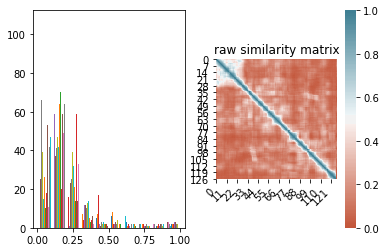

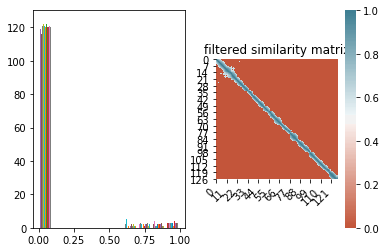

The results:
[139, 328, 717, 907, 1059, 1214, 1398, 1521, 1693, 1841, 2057, 2367, 2639, 2757, 2927, 3082, 3347, 3451, 3571, 3721, 3835, 4032, 4141, 4336, 4534, 4682, 4815]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  7        |  0.7143   |  28.0     |  0.6      |  22.67    |  120.0    |


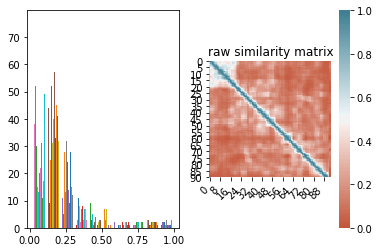

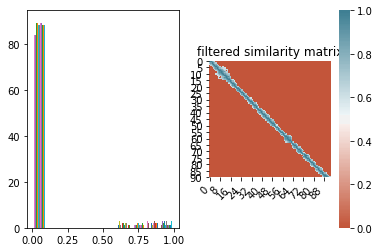

The results:
[163, 390, 745, 1006, 1165, 1310, 1413, 1647, 1931, 2174, 2437, 2660, 2763, 2878, 3063, 3351, 3559, 3820, 4027, 4294, 4555, 4711]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  8        |  0.5714   |  23.0     |  0.6      |  30.0     |  125.7    |


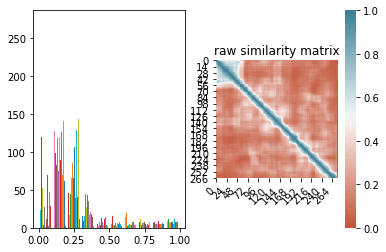

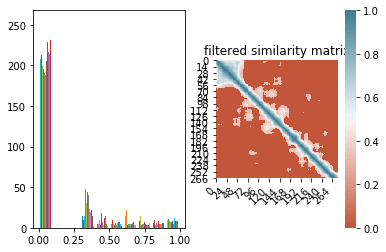

The results:
[184, 476, 751, 959, 1212, 1409, 1611, 1915, 2153, 2373, 2534, 2700, 2890, 3060, 3303, 3542, 3771, 4024, 4163, 4353, 4558, 4777]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  9        |  0.2857   |  23.0     |  0.3      |  10.0     |  170.0    |
GJpt_3ie4WU
{'target': 1.0, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 30.0, 'window_size': 120.0}}
Running workflow sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


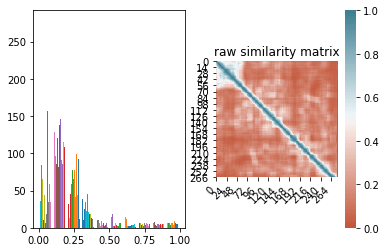

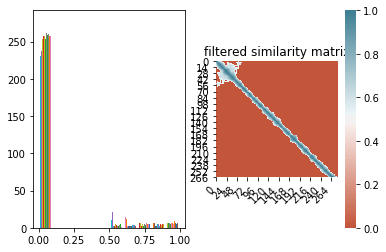

The results:
[112, 580, 802, 997, 1202, 1359, 1490, 1678, 1877, 2112, 2360, 2565, 2708, 2848, 3037, 3266, 3379, 3584, 3793, 4009, 4173, 4351, 4561, 4798, 4993]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  1        |  0.2857   |  25.09    |  0.5161   |  10.0     |  135.1    |


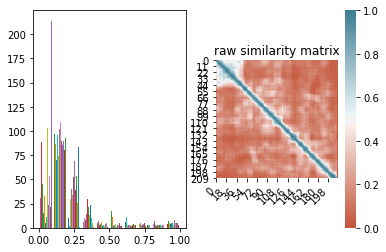

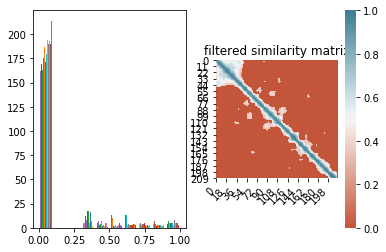

The results:
[297, 531, 750, 1024, 1198, 1424, 1613, 1802, 2016, 2365, 2564, 2800, 3034, 3303, 3521, 3688, 3885, 4040, 4227, 4356, 4491, 4728, 4994]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  2        |  0.5714   |  23.73    |  0.3277   |  13.73    |  137.3    |


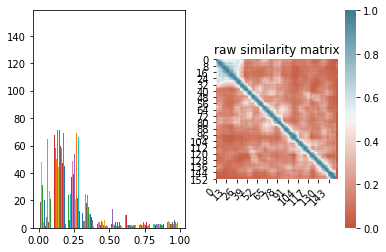

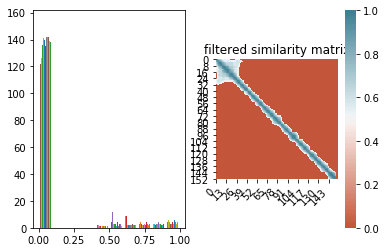

label 0 has done already cannot evaluate unsequentional segmentation, try other parameters
|  3        |  0.0      |  24.98    |  0.4616   |  18.38    |  154.3    |


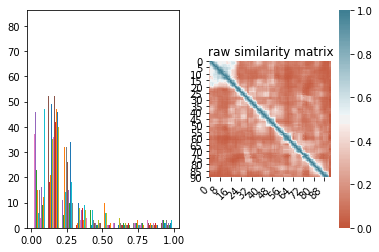

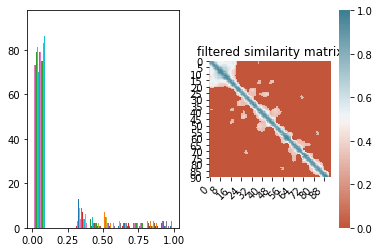

The results:
[169, 349, 527, 752, 911, 1013, 1222, 1322, 1421, 1657, 1872, 2001, 2286, 2406, 2554, 2767, 2882, 3066, 3313, 3569, 3720, 3988, 4136, 4351, 4462, 4721, 4979]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  4        |  0.4286   |  28.0     |  0.3      |  30.0     |  135.8    |


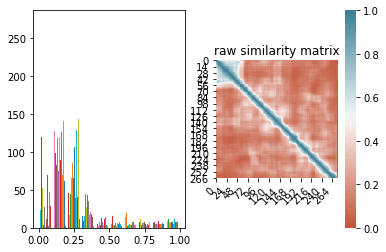

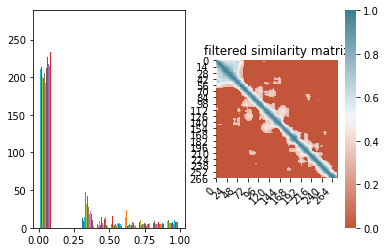

The results:
[184, 443, 652, 852, 1212, 1392, 1590, 1915, 2127, 2373, 2534, 2790, 3046, 3276, 3377, 3559, 3716, 3849, 4024, 4127, 4364, 4709, 4999]
The ground base:
[324, 733, 855, 1015, 1135, 1820, 2673]
|  5        |  0.1429   |  23.0     |  0.3      |  10.0     |  170.0    |


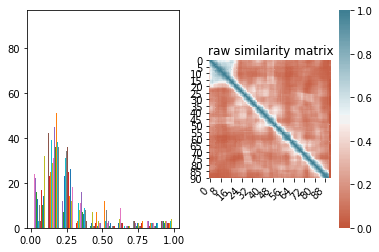

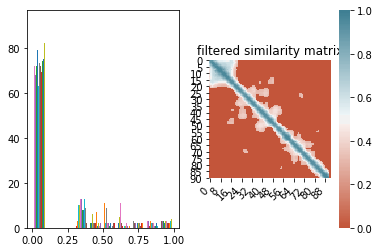

label 4 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  28.0     |  0.3      |  30.0     |  170.0    |


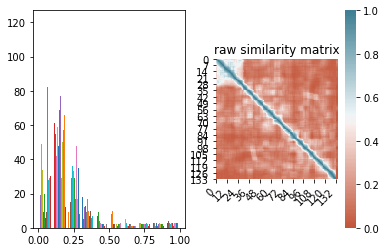

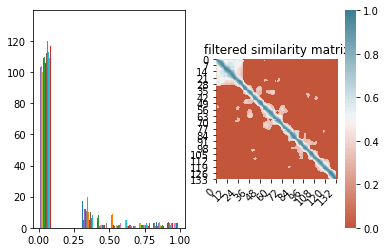

label 4 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  28.0     |  0.3      |  21.67    |  125.9    |


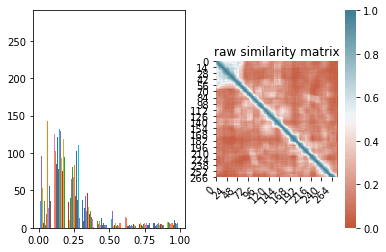

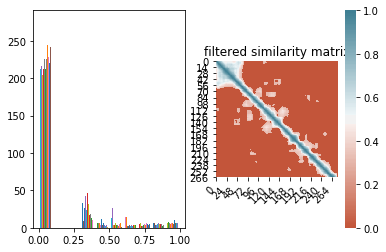

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  8        |  0.0      |  28.0     |  0.3      |  10.0     |  145.9    |


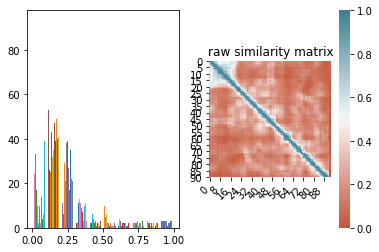

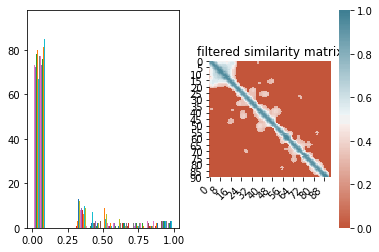

label 2 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  28.0     |  0.3      |  30.0     |  147.4    |
GJpt_3ie4WU
{'target': 0.5714285714285714, 'params': {'n_clusters': 23.733779454085564, 'sim_thresh': 0.32770157843063935, 'step_size': 13.725204227553418, 'window_size': 137.27803635215238}}
running on video bTyxpoi2dmM
Running workflow sliding_window-tfidf-cosine-None-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


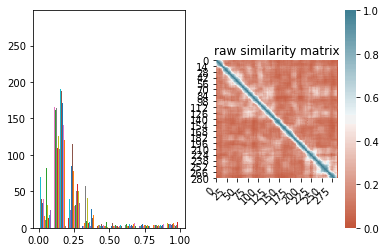

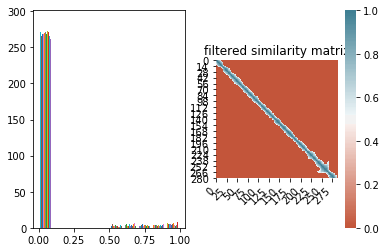

The results:
[89, 135, 321, 536, 735, 910, 1047, 1247, 1437, 1642, 1796, 1947, 2144, 2328, 2591, 2814, 3079, 3242, 3445, 3657, 3950, 4173, 4532, 4741, 4992]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  1        |  0.625    |  25.09    |  0.5161   |  10.0     |  135.1    |


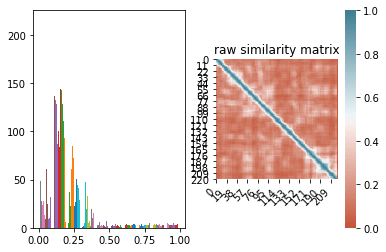

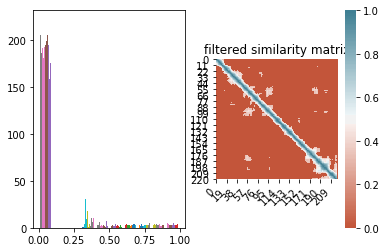

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


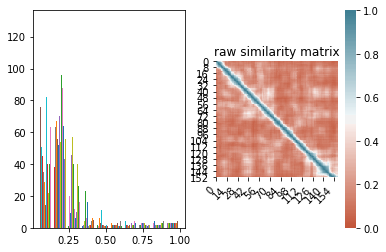

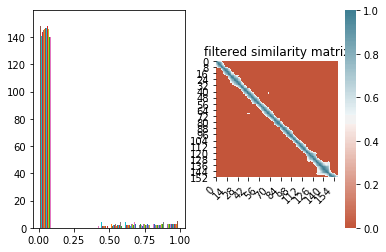

The results:
[135, 365, 572, 756, 968, 1209, 1464, 1687, 1841, 2049, 2241, 2357, 2528, 2745, 2983, 3187, 3396, 3590, 3714, 3909, 4198, 4501, 4748]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  3        |  0.5      |  24.98    |  0.4616   |  18.38    |  154.3    |


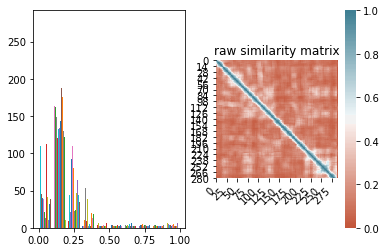

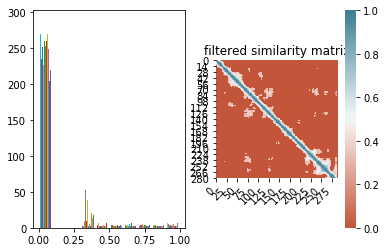

The results:
[91, 251, 342, 456, 626, 753, 872, 1039, 1240, 1485, 1647, 1790, 1926, 2086, 2254, 2418, 2611, 2829, 3012, 3130, 3246, 3420, 3578, 3762, 3992, 4553, 4732, 4989]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  4        |  0.875    |  28.0     |  0.3      |  10.0     |  124.0    |


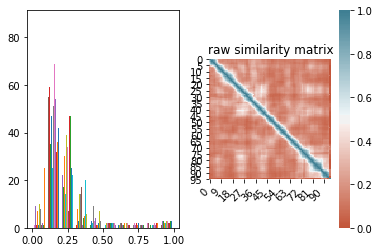

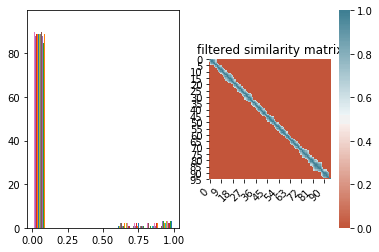

The results:
[113, 190, 332, 433, 633, 840, 1011, 1323, 1526, 1681, 1873, 2011, 2204, 2538, 2711, 2889, 3043, 3131, 3240, 3391, 3551, 3707, 3944, 4109, 4382, 4610, 4984]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  5        |  0.75     |  28.0     |  0.6      |  30.0     |  170.0    |


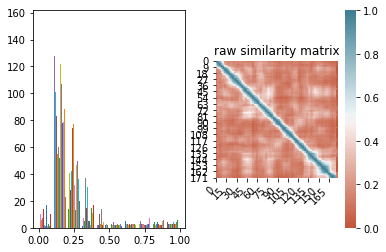

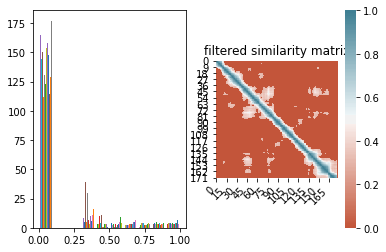

label 25 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  28.0     |  0.3      |  16.7     |  170.0    |


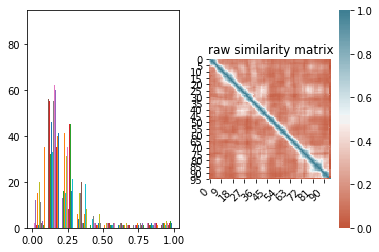

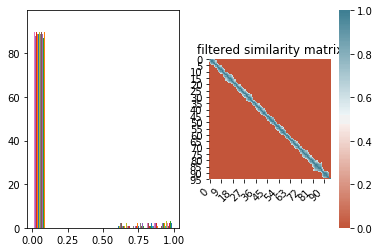

The results:
[107, 234, 383, 625, 786, 942, 1099, 1313, 1514, 1720, 1824, 1948, 2129, 2301, 2521, 2699, 2880, 3082, 3233, 3384, 3591, 3697, 3886, 4095, 4373, 4592, 4971]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  7        |  0.625    |  28.0     |  0.6      |  30.0     |  158.6    |


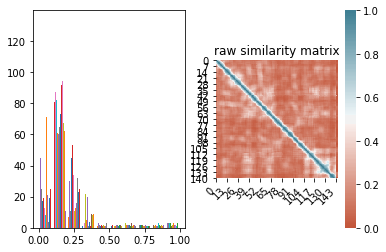

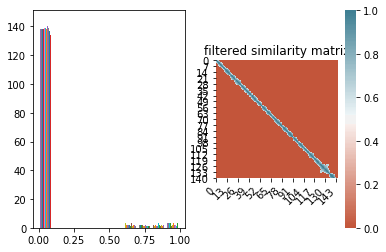

The results:
[95, 294, 490, 628, 770, 905, 1061, 1256, 1429, 1656, 1795, 1932, 2103, 2259, 2484, 2648, 2878, 3077, 3169, 3261, 3440, 3610, 3783, 4014, 4187, 4561, 4772, 4973]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  8        |  0.75     |  28.0     |  0.6      |  20.98    |  120.0    |


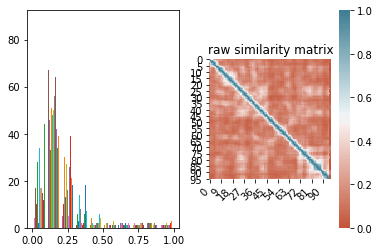

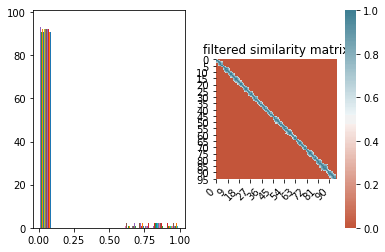

The results:
[124, 296, 350, 605, 730, 898, 1073, 1281, 1430, 1660, 1811, 1933, 2105, 2275, 2499, 2681, 2859, 3066, 3207, 3364, 3529, 3675, 3872, 4014, 4229, 4514, 4676, 4976]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  9        |  0.75     |  28.0     |  0.6      |  30.0     |  132.0    |
bTyxpoi2dmM
{'target': 0.875, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.3, 'step_size': 10.0, 'window_size': 123.99641712956425}}
Running workflow sliding_window-tfidf-cosine-median_(2,2)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


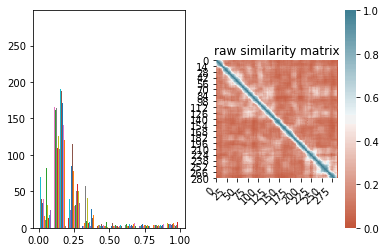

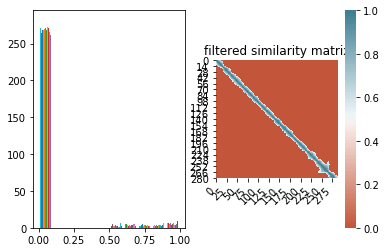

The results:
[116, 321, 552, 735, 910, 1064, 1247, 1452, 1672, 1823, 1978, 2162, 2328, 2591, 2795, 3034, 3138, 3252, 3445, 3672, 3975, 4199, 4549, 4772]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  1        |  0.5      |  25.09    |  0.5161   |  10.0     |  135.1    |


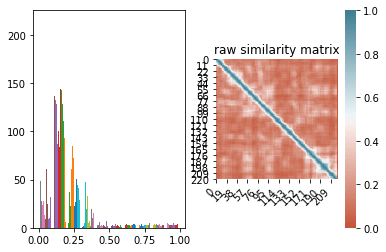

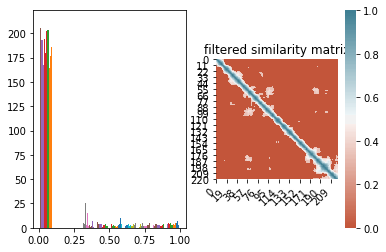

label 4 has done already cannot evaluate unsequentional segmentation, try other parameters
|  2        |  0.0      |  23.73    |  0.3277   |  13.73    |  137.3    |


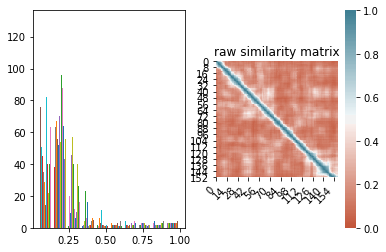

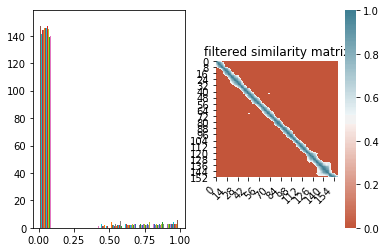

The results:
[162, 365, 572, 874, 1066, 1284, 1433, 1657, 1812, 2049, 2241, 2357, 2576, 2745, 2983, 3153, 3343, 3532, 3714, 3909, 4198, 4501, 4748]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  3        |  0.5      |  24.98    |  0.4616   |  18.38    |  154.3    |


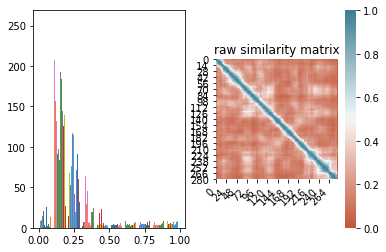

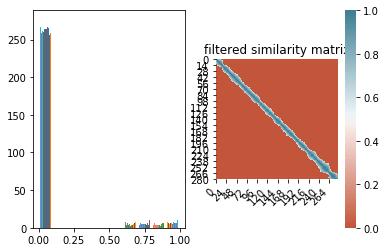

The results:
[137, 323, 483, 663, 898, 1027, 1177, 1354, 1529, 1732, 1832, 1964, 2111, 2282, 2498, 2641, 2786, 2978, 3114, 3207, 3338, 3518, 3707, 3964, 4158, 4516, 4639]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  4        |  0.625    |  28.0     |  0.6      |  10.0     |  170.0    |


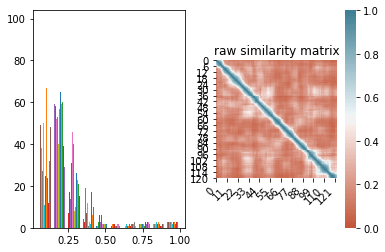

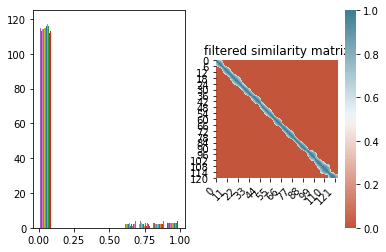

The results:
[168, 351, 529, 621, 804, 958, 1043, 1278, 1511, 1669, 1785, 1919, 2063, 2269, 2521, 2702, 2964, 3144, 3230, 3351, 3544, 3702, 3880, 4004, 4161, 4513, 4742]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  5        |  0.625    |  28.0     |  0.6      |  23.65    |  170.0    |


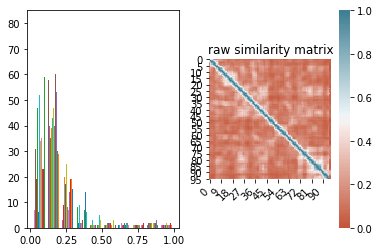

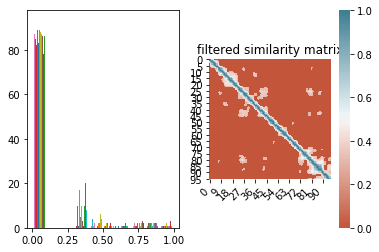

label 2 has done already cannot evaluate unsequentional segmentation, try other parameters
|  6        |  0.0      |  28.0     |  0.3      |  30.0     |  120.0    |


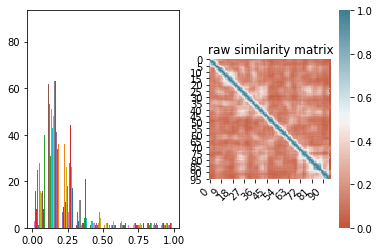

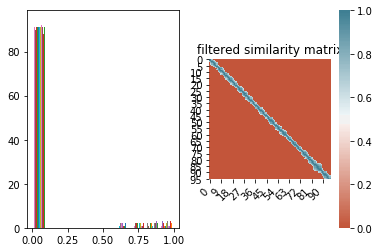

The results:
[128, 299, 454, 652, 854, 1036, 1124, 1235, 1503, 1707, 1813, 1939, 2110, 2286, 2458, 2628, 2868, 3070, 3216, 3375, 3576, 3679, 3830, 3970, 4182, 4569, 4780]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  7        |  0.5      |  28.0     |  0.6      |  30.0     |  141.0    |


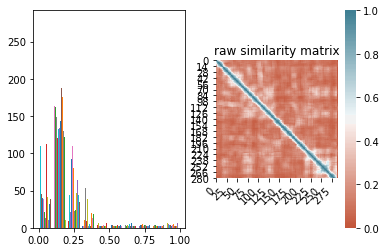

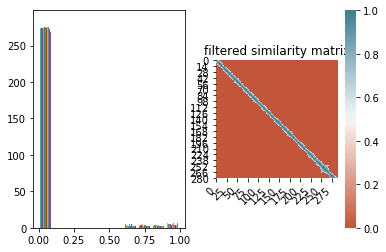

The results:
[91, 151, 326, 541, 743, 913, 1056, 1240, 1423, 1647, 1790, 1941, 2100, 2269, 2473, 2632, 2851, 3061, 3183, 3337, 3520, 3662, 3861, 4023, 4214, 4553, 4781]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  8        |  0.75     |  28.0     |  0.6      |  10.0     |  123.3    |


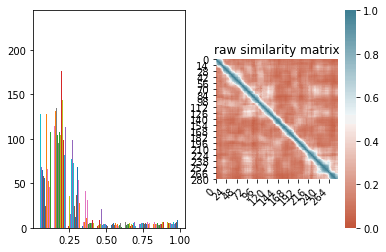

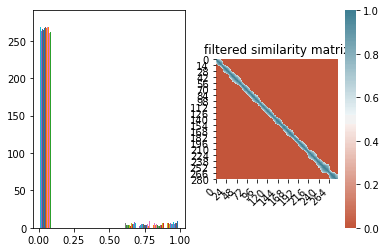

The results:
[116, 285, 365, 483, 637, 772, 932, 1089, 1277, 1473, 1686, 1826, 1952, 2097, 2259, 2447, 2634, 2836, 3065, 3180, 3323, 3464, 3635, 3852, 4071, 4339, 4618]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  9        |  0.625    |  28.0     |  0.6      |  10.0     |  158.8    |
bTyxpoi2dmM
{'target': 0.75, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 123.34157224981936}}
Running workflow sliding_window-tfidf-cosine-median_(3,3)-spectral_clustering
|   iter    |  target   | n_clus... | sim_th... | step_size | window... |
-------------------------------------------------------------------------


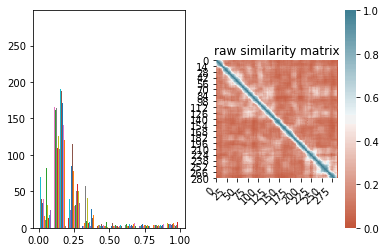

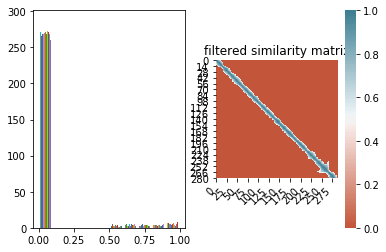

The results:
[135, 321, 494, 660, 852, 1034, 1231, 1416, 1653, 1807, 1947, 2109, 2299, 2538, 2795, 3052, 3195, 3366, 3577, 3724, 3975, 4173, 4549, 4756, 4992]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  1        |  0.625    |  25.09    |  0.5161   |  10.0     |  135.1    |


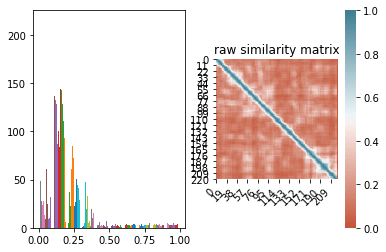

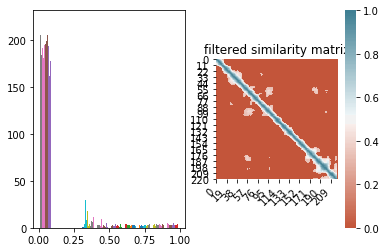

The results:
[127, 322, 489, 752, 957, 1221, 1497, 1680, 1838, 2029, 2225, 2328, 2555, 2805, 3082, 3249, 3430, 3658, 3867, 4117, 4564, 4770, 4996]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  2        |  0.625    |  23.73    |  0.3277   |  13.73    |  137.3    |


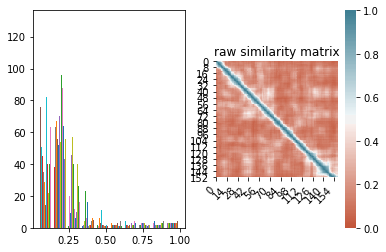

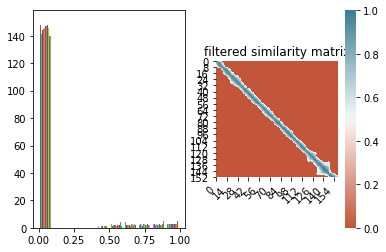

The results:
[162, 365, 502, 726, 943, 1096, 1284, 1497, 1722, 1863, 2049, 2241, 2497, 2682, 2885, 3123, 3317, 3532, 3649, 3880, 4161, 4501, 4748]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  3        |  0.375    |  24.98    |  0.4616   |  18.38    |  154.3    |


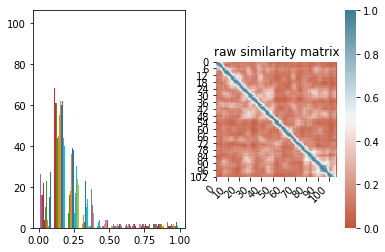

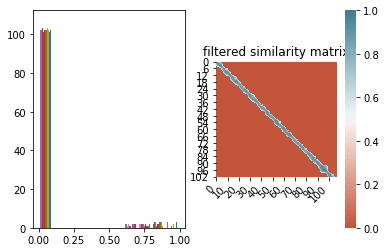

The results:
[147, 307, 490, 629, 782, 925, 1059, 1234, 1421, 1623, 1761, 1951, 2111, 2269, 2365, 2574, 2843, 3074, 3206, 3342, 3538, 3670, 3851, 4019, 4210, 4567, 4756, 4991]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  4        |  0.625    |  28.0     |  0.6      |  27.88    |  132.9    |


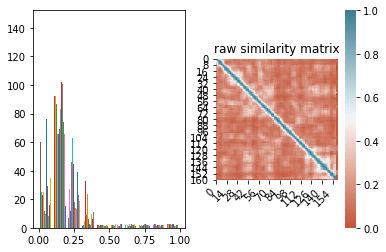

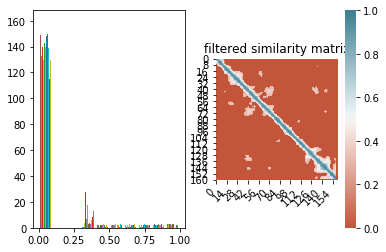

label 21 has done already cannot evaluate unsequentional segmentation, try other parameters
|  5        |  0.0      |  28.0     |  0.3      |  18.95    |  123.4    |


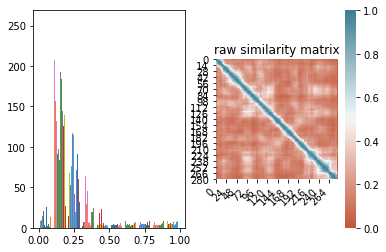

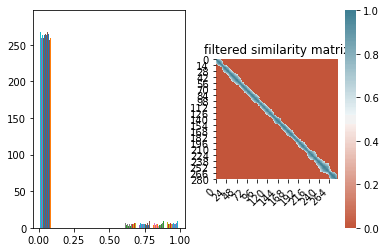

The results:
[152, 304, 402, 563, 738, 930, 1097, 1322, 1529, 1719, 1860, 2012, 2162, 2282, 2455, 2654, 2908, 3088, 3207, 3348, 3549, 3707, 3879, 4065, 4158, 4516, 4779, 4984]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  6        |  0.25     |  28.0     |  0.6      |  10.0     |  170.0    |


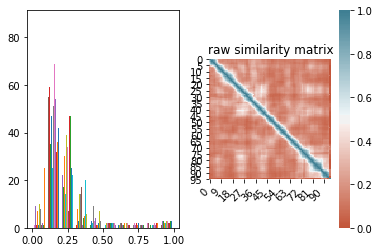

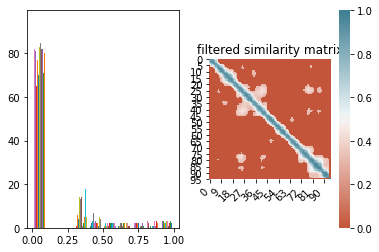

label 1 has done already cannot evaluate unsequentional segmentation, try other parameters
|  7        |  0.0      |  28.0     |  0.3      |  30.0     |  170.0    |


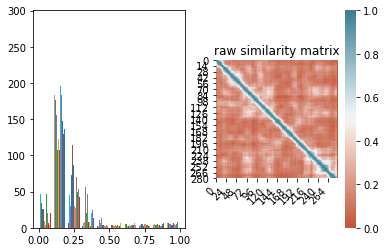

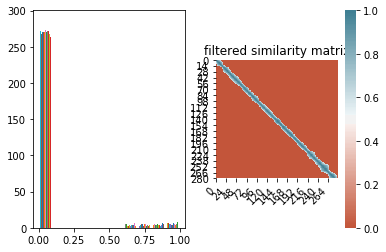

The results:
[121, 318, 446, 632, 778, 926, 1054, 1239, 1410, 1647, 1777, 1940, 2120, 2277, 2458, 2621, 2827, 3041, 3165, 3314, 3470, 3620, 3720, 3982, 4185, 4526, 4748, 4994]
The ground base:
[90, 360, 665, 885, 985, 1620, 2233, 3220]
|  8        |  0.75     |  28.0     |  0.6      |  10.0     |  146.5    |


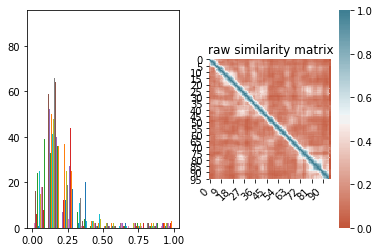

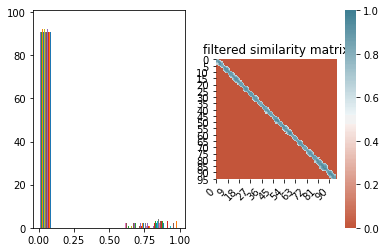

label 9 has done already cannot evaluate unsequentional segmentation, try other parameters
|  9        |  0.0      |  28.0     |  0.6      |  30.0     |  144.5    |
bTyxpoi2dmM
{'target': 0.75, 'params': {'n_clusters': 28.0, 'sim_thresh': 0.6, 'step_size': 10.0, 'window_size': 146.4660366696624}}


In [57]:
for vid in videos_ids:
    print("running on video %s" %(vid))
    groundbase = df_videos.loc[df_videos['video id'] == vid,'topic shifts(ends)'].values.tolist()[:-1]
    tr = transcripts_jsons[vid]
    for model in models:
        #samples = [d["train"] for d in dataset if d[model] == model][0]
        for workflow_label in models_workflow[model]:
            print('Running workflow %s' %(workflow_label))
            
            #models_path = os.path.join('../data/processed/bayesian_opt/phrases',('%s.json' %(vid +"_"+ workflow_label)))
            
            model_file_path = os.path.join('../data/processed/bayesian_opt/phrases',
                                           ('%s.json' %(vid +"_"+ workflow_label)))
            
            function_to_optimized = functionsBuilder(groundbase=groundbase,
                                                     transcripts=tr).build_f_to_optimize(workflow_label)
            
            optimizer = BayesianOptimization(
                f=function_to_optimized,
                pbounds=param_bounds[workflow_label],
                verbose=2,
                random_state=1
                )
            
            if os.path.isfile(model_file_path):
                load_logs(optimizer,logs=[model_file_path])
            else:
                logger = JSONLogger(path=model_file_path)
                optimizer.subscribe(Events.OPTIMIZATION_STEP, logger)
            
            optimizer.maximize(
                init_points = 3,
                n_iter = 6
            )
            print(vid)
            print(optimizer.max)
            for res in optimizer.res:
                df_results = df_results.append({'video':vid,
                                                'max_target':res['target'],
                                                'workflow':workflow_label,
                                                'params':res['params'],
                                                'param_bounds':param_bounds[workflow_label]
                                               },ignore_index=True)
        

Check the model on the Training set

In [58]:
df_results.to_csv(results_csv)

Examine bias and variance